===================================================
### Code developed by: Vinicius Luiz Santos Silva

### Contact: v.santos-silva19@imperial.ac.uk
===================================================

In [1]:
%%javascript
IPython.notebook.kernel.execute(`notebookName = '${IPython.notebook.notebook_name}'`)

<IPython.core.display.Javascript object>

In [2]:
notebookName='WGAN-GP-training_4'
notebookName

'WGAN-GP-training_4'

In [3]:
# Python ≥3.5 is required
import sys
assert sys.version_info >= (3, 5)

# Scikit-Learn ≥0.20 is required
import sklearn
assert sklearn.__version__ >= "0.20"

# TensorFlow ≥2.0 is required
import tensorflow as tf
from tensorflow import keras
assert tf.__version__ >= "2.0"

# Common imports
import numpy as np
import os

# To plot pretty figures
%matplotlib inline
import matplotlib as mpl
import matplotlib.pyplot as plt
mpl.rc('axes', labelsize=14)
mpl.rc('xtick', labelsize=12)
mpl.rc('ytick', labelsize=12)

import pandas as pd
import time

In [4]:
print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))

Num GPUs Available:  1


In [5]:
# Constants


## Load data

In [6]:
# Mesh size
nl = 10
nc = 10
print('Grid: ', nl, 'x',nc)

Grid:  10 x 10


In [7]:
import joblib
#joblib.dump(pca_compress, "pca_compress_15.pkl") 
#np.savetxt('X_train_1D.csv', X_train_1D, delimiter=',') 
#np.savetxt('X_train_pca.csv', X_train_pca, delimiter=',') 
#np.savetxt('times.csv', times, delimiter=',') 
#with open('groups.txt','w') as f:
#    f.writelines([g + '\n' for g in groups])

#...
pca_compress = joblib.load("/content/drive/MyDrive/masters/small_dataset/pca_compress_15.pkl") 
X_train_compressed = np.loadtxt('/content/drive/MyDrive/masters/small_dataset/X_train_pca.csv', delimiter=',') 

X_train_1D = np.loadtxt('/content/drive/MyDrive/masters/small_dataset/X_train_1D.csv', delimiter=',') 
times  = np.loadtxt('/content/drive/MyDrive/masters/small_dataset/times.csv', delimiter=',') 
with open('/content/drive/MyDrive/masters/small_dataset/groups.txt') as f:
    groups = [g.strip() for g in f.readlines()]

# PCA recovered
X_recovered = pca_compress.inverse_transform(X_train_compressed)

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:144: FutureWarning: The sklearn.decomposition.pca module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.decomposition. Anything that cannot be imported from sklearn.decomposition is now part of the private API.
  warnings.warn(message, FutureWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/base.py:318: UserWarning: Trying to unpickle estimator PCA from version 0.21.3 when using version 0.22.2.post1. This might lead to breaking code or invalid results. Use at your own risk.
  UserWarning)


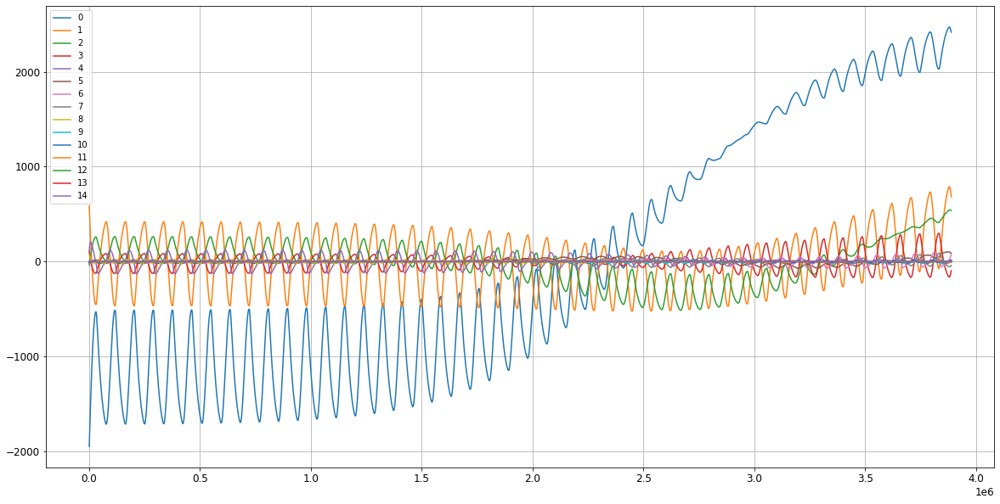

In [8]:
fig, ax = plt.subplots(1,1, figsize=[20,10])
ax.plot(times, X_train_compressed);
ax.grid()
ax.legend(range(15))

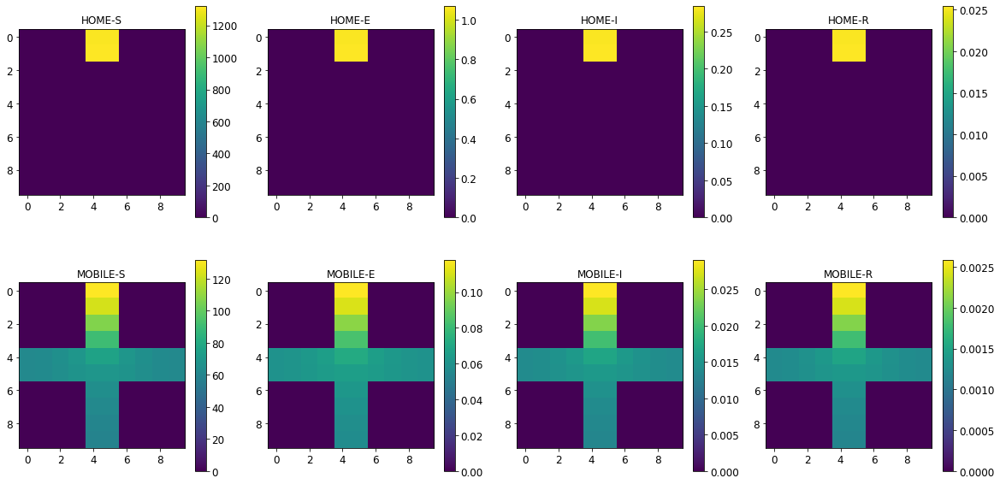

In [9]:
fig, ax = plt.subplots(2,4, figsize=[20,10])
for i, group in enumerate(groups):
    im = ax.flatten()[i].imshow(X_train_1D.reshape(len(times),len(groups),nl,nc)[100,i,:,:])
    fig.colorbar(im, ax=ax.flatten()[i])
    ax.flatten()[i].set_title(group)

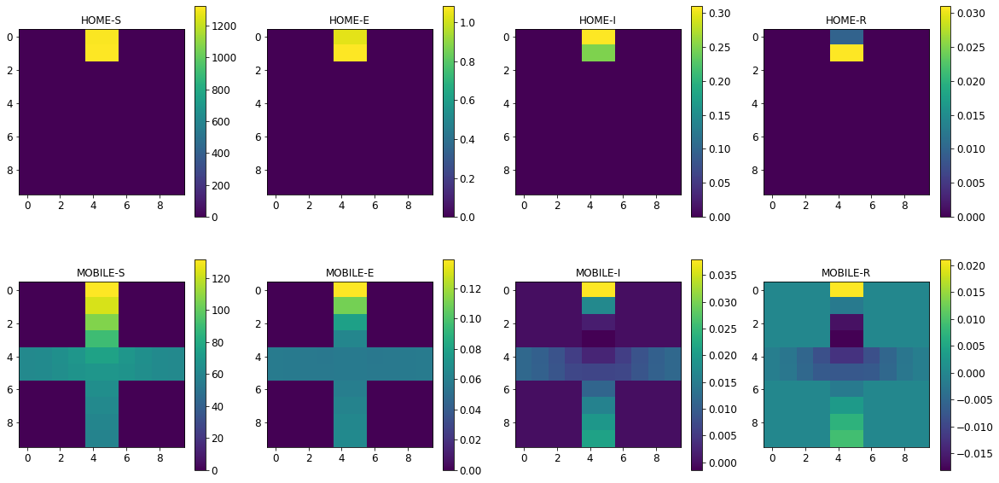

In [10]:
fig, ax = plt.subplots(2,4, figsize=[20,10])
for i, group in enumerate(groups):
    im = ax.flatten()[i].imshow(X_recovered.reshape(len(times),len(groups),nl,nc)[100,i,:,:])
    fig.colorbar(im, ax=ax.flatten()[i])
    ax.flatten()[i].set_title(group)

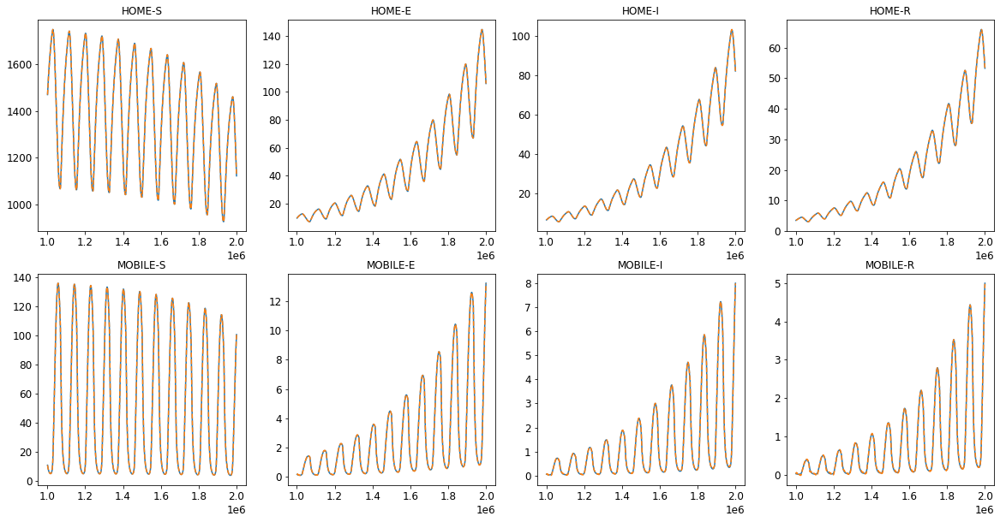

In [11]:


fig, ax = plt.subplots(2,4, figsize=[20,10])
for i, group in enumerate(groups):
    ax.flatten()[i].plot(times[1000:2000], X_train_1D[1000:2000,i*nl*nc+4])
    ax.flatten()[i].plot(times[1000:2000], X_recovered[1000:2000,i*nl*nc+4],'--')
    ax.flatten()[i].set_title(group)

## Prepare data

In [12]:
codings_size = X_train_compressed.shape[1]
X_train_compressed.shape

(3888, 15)

In [13]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
X_train_scaled = scaler.fit_transform(X_train_compressed)*2 -1 
np.allclose(X_train_compressed, scaler.inverse_transform((X_train_scaled+1)/2))

True

In [14]:
def concat_timesteps(X_train, ntimes, step):
    X_train_concat = []
    for i in range(len(X_train) - ntimes*step):
        X_train_concat.append(X_train[i:i+ntimes*step:step])
    return np.array(X_train_concat)

In [15]:
ntimes = 9 # Consecutive times for the GAN
step = 10 # step between times

X_train_concat = concat_timesteps(X_train_scaled, ntimes, step)
print(X_train_concat.shape[0])
X_train_concat_flatten = X_train_concat.reshape(X_train_concat.shape[0], codings_size*ntimes )

3798


(3798, 9, 15)


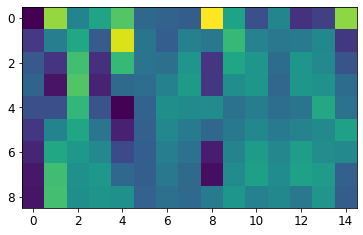

In [16]:
print(X_train_concat.shape)
plt.imshow(X_train_concat[0, :, :])

## Train the GAN

In [17]:
BATCH_SIZE = 256
latent_space = 100

# Create a tensorflow dataset and split it into batches
print(np.shape(X_train_concat))
train_dataset = X_train_concat.reshape(X_train_concat.shape[0], 9, 15, 1).astype('float32')
print(np.shape(train_dataset))
train_dataset = tf.data.Dataset.from_tensor_slices(train_dataset)
print(len(X_train_concat))
train_dataset = train_dataset.shuffle(len(X_train_concat))
train_dataset = train_dataset.batch(BATCH_SIZE)
print(type(train_dataset))
for data in train_dataset:
    print(data)
    break

(3798, 9, 15)
(3798, 9, 15, 1)
3798
<class 'tensorflow.python.data.ops.dataset_ops.BatchDataset'>
tf.Tensor(
[[[[-0.3154476 ]
   [-0.9122911 ]
   [ 0.3906047 ]
   ...
   [-0.00677366]
   [-0.04424414]
   [-0.16786328]]

  [[-0.39347434]
   [-0.70152575]
   [ 0.30148476]
   ...
   [-0.14260608]
   [ 0.25528052]
   [-0.70725644]]

  [[-0.5643905 ]
   [-0.25979212]
   [ 0.12093607]
   ...
   [-0.12037025]
   [-0.21597125]
   [ 0.06558049]]

  ...

  [[-0.7232341 ]
   [ 0.1450893 ]
   [-0.04294686]
   ...
   [-0.16255231]
   [-0.02763683]
   [-0.19724496]]

  [[-0.53170097]
   [-0.34501883]
   [ 0.15074718]
   ...
   [-0.07763334]
   [-0.09669346]
   [-0.17436914]]

  [[-0.35885438]
   [-0.78180027]
   [ 0.32049015]
   ...
   [-0.01655599]
   [-0.08162231]
   [-0.16529737]]]


 [[[ 0.59668577]
   [-0.47958076]
   [-0.24665906]
   ...
   [-0.06778233]
   [-0.76662636]
   [-0.43996695]]

  [[ 0.5860048 ]
   [-0.7474655 ]
   [-0.11393991]
   ...
   [-0.18552016]
   [-0.2843586 ]
   [-0.309728

In [18]:
def make_generator_model():
    model = tf.keras.Sequential()
    model.add(keras.layers.Dense(5*4*256, use_bias=False, input_shape=(latent_space,)))
    model.add(keras.layers.LayerNormalization())
    model.add(keras.layers.LeakyReLU())

    model.add(keras.layers.Reshape((5, 4, 256)))

    model.add(keras.layers.Conv2DTranspose(128, (3, 3), strides=(1, 1), padding='same', use_bias=False))
    model.add(keras.layers.LayerNormalization())
    model.add(keras.layers.LeakyReLU())

    model.add(keras.layers.Conv2DTranspose(64, (3, 3), strides=(1, 2), padding='same', use_bias=False))
    model.add(keras.layers.LayerNormalization())
    model.add(keras.layers.LeakyReLU())

    model.add(keras.layers.Conv2DTranspose(1, (5, 1), strides=(2, 2), padding='same', output_padding=[0,0], use_bias=False, activation='tanh'))

    return model

In [19]:
generator = make_generator_model()
generator.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 5120)              512000    
_________________________________________________________________
layer_normalization (LayerNo (None, 5120)              10240     
_________________________________________________________________
leaky_re_lu (LeakyReLU)      (None, 5120)              0         
_________________________________________________________________
reshape (Reshape)            (None, 5, 4, 256)         0         
_________________________________________________________________
conv2d_transpose (Conv2DTran (None, 5, 4, 128)         294912    
_________________________________________________________________
layer_normalization_1 (Layer (None, 5, 4, 128)         256       
_________________________________________________________________
leaky_re_lu_1 (LeakyReLU)    (None, 5, 4, 128)         0

(1, 9, 15, 1)


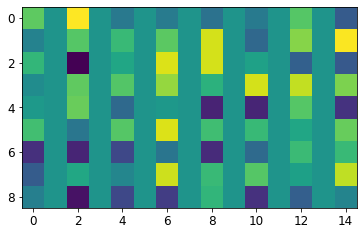

In [20]:
noise = tf.random.normal([1, 100])
generated_image = generator(noise, training=False)
print(generated_image.shape)
plt.imshow(generated_image[0, :, :, 0])

In [21]:
def make_critic_model():
    model = tf.keras.Sequential()
    model.add(keras.layers.Conv2D(64, (3, 3), strides=(2, 2), padding='same',
                                     input_shape=[9, 15, 1]))
    model.add(keras.layers.LayerNormalization())
    model.add(keras.layers.LeakyReLU())
    model.add(keras.layers.Dropout(0.3))

    model.add(keras.layers.Conv2D(128, (5, 5), strides=(1, 2), padding='same'))
    model.add(keras.layers.LayerNormalization())
    model.add(keras.layers.LeakyReLU())
    model.add(keras.layers.Dropout(0.3))
    # could swap dropout and flatten layers
    model.add(keras.layers.Flatten())
    model.add(keras.layers.Dense(1))

    return model

In [22]:
critic = make_critic_model()
critic.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 5, 8, 64)          640       
_________________________________________________________________
layer_normalization_3 (Layer (None, 5, 8, 64)          128       
_________________________________________________________________
leaky_re_lu_3 (LeakyReLU)    (None, 5, 8, 64)          0         
_________________________________________________________________
dropout (Dropout)            (None, 5, 8, 64)          0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 5, 4, 128)         204928    
_________________________________________________________________
layer_normalization_4 (Layer (None, 5, 4, 128)         256       
_________________________________________________________________
leaky_re_lu_4 (LeakyReLU)    (None, 5, 4, 128)        

In [23]:
decision = critic(generated_image)
print (decision)

tf.Tensor([[-2.2428517]], shape=(1, 1), dtype=float32)


In [24]:
#gan = keras.models.Sequential([generator, discriminator])
wgan = keras.models.Sequential([generator, critic])

In [25]:
# This method returns a helper function to compute cross entropy loss
# cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

# def discriminator_loss(real_output, fake_output):
#     real_loss = cross_entropy(tf.ones_like(real_output), real_output)
#     fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
#     total_loss = real_loss + fake_loss
#     return total_loss

def critic_loss(real_output, fake_output):
    real_loss = tf.reduce_mean(real_output)
    fake_loss = tf.reduce_mean(fake_output)
    return fake_loss - real_loss


# def generator_loss(fake_output):
#     return cross_entropy(tf.ones_like(fake_output), fake_output)

def generator_loss(fake_output):
    return -tf.reduce_mean(fake_output)

generator_mean_loss = tf.keras.metrics.Mean(dtype=tf.float32)
critic_mean_loss = tf.keras.metrics.Mean(dtype=tf.float32)

In [26]:
# The discriminator and the generator optimizers are different since we will train two networks separately.
# generator_optimizer = tf.keras.optimizers.Adam(1e-4)
# discriminator_optimizer = tf.keras.optimizers.Adam(1e-4)
generator_optimizer = tf.keras.optimizers.Adam(1e-4)
critic_optimizer = tf.keras.optimizers.Adam(1e-4)
# generator_optimizer = keras.optimizers.Adam(
#     learning_rate=0.0002, beta_1=0.5, beta_2=0.9)
# critic_optimizer = keras.optimizers.Adam(
#     learning_rate=0.0002, beta_1=0.5, beta_2=0.9)

In [27]:
def gradient_penalty(real, fake):
    """
    WGAN-GP uses gradient penalty instead of the weight
    clipping to enforce the Lipschitz constraint.
    """

    # alpha = tf.random.normal([self.BATCH_SIZE, self.n_var], mean=0.0, stddev=0.1)
    if real.shape[0]==BATCH_SIZE:
        alpha = tf.random.uniform(shape=[BATCH_SIZE, 1, 1, 1], minval=0., maxval=1.)
    else:
        alpha = tf.random.uniform(shape=[real.shape[0]%BATCH_SIZE, 1, 1, 1], minval=0., maxval=1.)
    interpolated = real + alpha * (fake - real)
    # print('interpolated ', np.shape(interpolated))

    with tf.GradientTape() as t:
        t.watch(interpolated)
        pred = critic(interpolated, training=True)
        # print('pred', np.shape(pred))
    grad = t.gradient(pred, interpolated)
    gradient_norm = tf.norm(grad)
    gp = tf.reduce_mean((gradient_norm - 1)**2)
    return gp
    # print('grad', np.shape(grad))
    # print('tf.square(grad)', tf.shape(tf.square(grad)))
    # print('tf.reduce_sum(tf.square(grad)', tf.shape(tf.reduce_sum(tf.square(grad))))
    # print('tf.sqrt(tf.reduce_sum(tf.square(grad)) + 1e-12)', tf.shape(tf.sqrt(tf.reduce_sum(tf.square(grad)) + 1e-12)))
    # norm = tf.sqrt(tf.reduce_sum(tf.square(grad)) + 1e-12)
    # print('norm', tf.shape(norm))


In [28]:
# We will reuse this seed overtime 
num_examples_to_generate = 5
seed = tf.random.normal([num_examples_to_generate, latent_space])

In [29]:
# logs to follow losses on tensorboard
#current_time = datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
generator_log_dir = './logs/' + 'WGAN-GP_4' + '/generator'
critic_log_dir = './logs/' + 'WGAN-GP_4' + '/critic'

generator_summary_writer = tf.summary.create_file_writer(generator_log_dir)
critic_summary_writer = tf.summary.create_file_writer(critic_log_dir)

In [30]:
@tf.function
def train_G(batch):
    """
    The training routine for the generator
    """
    if batch.shape[0]==BATCH_SIZE:
        noise = tf.random.normal([BATCH_SIZE, latent_space], mean=0.0, stddev=0.1)
    else:
        noise = tf.random.normal([batch.shape[0]%BATCH_SIZE, latent_space], mean=0.0, stddev=0.1)

    with tf.GradientTape() as gen_tape:
        generated_data = generator(noise, training=True)
        fake_output = critic(generated_data, training=True)
        gen_loss = generator_loss(fake_output)

    gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))

    # return tf.math.abs(gen_loss)
    # print('gen_loss', tf.shape(gen_loss))
    return gen_loss

In [31]:

@tf.function
def train_D(batch):
    """
    The training routine for the critic
    """
    if batch.shape[0]==BATCH_SIZE:
        noise = tf.random.normal([BATCH_SIZE, latent_space], mean=0.0, stddev=0.1)
    else:
        noise = tf.random.normal([batch.shape[0]%BATCH_SIZE, latent_space], mean=0.0, stddev=0.1)

    with tf.GradientTape() as disc_tape:
        generated_data = generator(noise, training=True)

        real_output = critic(batch, training=True)
        fake_output = critic(generated_data, training=True)

        disc_loss = critic_loss(real_output, fake_output)
        gp = gradient_penalty(batch, generated_data)
        # disc_loss += (self.critic_loss(real_output, fake_output) + gp*10.0)
        disc_loss += gp*10.0

    gradients_of_critic = disc_tape.gradient(disc_loss, critic.trainable_variables)
    critic_optimizer.apply_gradients(zip(gradients_of_critic, critic.trainable_variables))

    # return tf.math.abs(disc_loss)
    # print('disc_loss', tf.shape(disc_loss))
    # print('disc_slice', tf.slice(disc_loss, [0], [-1]))
    

    return disc_loss

In [32]:
# Notice the use of `tf.function`
# This annotation causes the function to be "compiled".
# @tf.function
# def train_step(batch):
#     noise = tf.random.normal([BATCH_SIZE, latent_space])

#     with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
#         generated_images = generator(noise, training=True)

#         real_output = discriminator(batch, training=True)
#         fake_output = discriminator(generated_images, training=True)

#         gen_loss = generator_loss(fake_output)
#         disc_loss = discriminator_loss(real_output, fake_output)

#     gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
#     gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

#     generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
#     discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))
    
#     generator_mean_loss(gen_loss)
#     discriminator_mean_loss(disc_loss)


In [33]:
# test_count = 0
# def test_f(test_count):
#   print('done')
#   test_count += 1
#   return test_count

# def train_test(test_count, epochs=10):
#   for epoch in range(epochs):
#     test_f(test_count)
#     test_count = test_f(test_count)
#     print(test_count)
    
#   return 1

# bla = train_test(test_count)




In [34]:
# def train(dataset, epochs, scaler, scaled, X_train, y_train,n_critic=5):
def train(dataset, epochs, n_critic=5):
    """
    Training the WGAN-GP
    """

    hist = []
    for epoch in range(epochs):
        start = time.time()
        print("Epoch {}/{}".format(epoch, epochs))

        for batch in dataset:

            for _ in range(n_critic):
              # train_D(batch, count_D)
              disc_loss = train_D(batch)
            critic_mean_loss(disc_loss)
            # print('critic_mean_loss', critic_mean_loss.numpy())

            


            gen_loss = train_G(batch)
            generator_mean_loss(gen_loss)
            # train_G(batch, count_G)

        with critic_summary_writer.as_default():
              tf.summary.scalar('loss', critic_mean_loss.result(), step=epoch)

        with generator_summary_writer.as_default():
            tf.summary.scalar('loss', generator_mean_loss.result(), step=epoch)

        # with critic_summary_writer.as_default():
        #     tf.summary.scalar('loss', critic_mean_loss.result(), step=epoch)

        hist.append([generator_mean_loss.result().numpy(), critic_mean_loss.result().numpy()])

        generator_mean_loss.reset_states()
        critic_mean_loss.reset_states()

        # print("critic", "{}: {:.6f}".format(critic.metrics_names[0], hist[-1][1]), end=' - ')
        # print("generator", "{}: {:.6f}".format(wgan.metrics_names[0], hist[-1][0]), end=' - ')    
        # print ('{:.0f}s'.format( time.time()-start))

        print("critic: {:.6f}".format(hist[-1][1]), end=' - ')
        print("generator: {:.6f}".format(hist[-1][0]), end=' - ')
        print('{:.0f}s'.format( time.time()-start))

        print('disc_numpy', disc_loss.numpy())
        print('gen_numpy', gen_loss.numpy())
        # Global variables are used below
        if epoch%1000 == 0: 
            # Plot generated data
            X_generated = scaler.inverse_transform((generator.predict(seed).reshape(num_examples_to_generate*ntimes,15)+1)/2)
            X_generated = pca_compress.inverse_transform(X_generated)
            X_generated = X_generated.reshape(num_examples_to_generate, ntimes, len(groups)*nl*nc)
            fig, ax = plt.subplots(num_examples_to_generate*2,len(groups), figsize=[20,num_examples_to_generate*5])
            for j in range(num_examples_to_generate):
                for i, group in enumerate(groups):
                    for k in range(0,10,10): 
                        ax.flatten()[i+2*j*len(groups)].plot(X_generated[j][:,i*nl*nc+4+10*k], '-')
                for i, group in enumerate(groups):
                    im = ax.flatten()[i+(2*j+1)*len(groups)].imshow(X_generated[j].reshape(ntimes,len(groups),nl,nc)[4,i,:,:])
                    fig.colorbar(im, ax=ax.flatten()[i+(2*j+1)*len(groups)])
            plt.savefig('snapshot_images/town/'+'WGAN-GP_5_'+str(epoch)+'.jpeg')
            plt.show() 
            

            # Save model
            wgan.save('ganmodels/'+'WGAN-GP_5_'+str(epoch)+'.h5')
                        
    

            # plot loss
            print('Loss: ')
            fig, ax = plt.subplots(1,1, figsize=[20,10])
            ax.plot(hist[100:])
            ax.legend(['loss_gen', 'loss_disc'])
            # ax.set_yscale('log')
            ax.grid()
            plt.savefig('snapshot_images/loss/'+'WGAN-GP_5_'+str(epoch)+'.jpeg')
            plt.show()

    return hist


In [35]:
# def train(dataset, epochs):
#     hist = []
#     for epoch in range(epochs):
#         start = time.time()
#         print("Epoch {}/{}".format(epoch + 1, epochs))   

#         for batch in dataset:
#             train_step(batch)
            
#         with generator_summary_writer.as_default():
#             tf.summary.scalar('loss', generator_mean_loss.result(), step=epoch)

#         with discriminator_summary_writer.as_default():
#             tf.summary.scalar('loss', discriminator_mean_loss.result(), step=epoch)
        
#         hist.append([generator_mean_loss.result().numpy(), discriminator_mean_loss.result().numpy()])

#         generator_mean_loss.reset_states()
#         discriminator_mean_loss.reset_states()
        
#         print("discriminator", "{}: {:.6f}".format(discriminator.metrics_names[0], hist[-1][1]), end=' - ')
#         print("generator", "{}: {:.6f}".format(gan.metrics_names[0], hist[-1][0]), end=' - ')    
#         print ('{:.0f}s'.format( time.time()-start))

#         # Global variables are used below
#         if epoch%1000 == 0: 
#             # Plot generated data
#             X_generated = scaler.inverse_transform((generator.predict(seed).reshape(num_examples_to_generate*ntimes,15)+1)/2)
#             X_generated = pca_compress.inverse_transform(X_generated)
#             X_generated = X_generated.reshape(num_examples_to_generate, ntimes, len(groups)*nl*nc)
#             fig, ax = plt.subplots(num_examples_to_generate*2,len(groups), figsize=[20,num_examples_to_generate*5])
#             for j in range(num_examples_to_generate):
#                 for i, group in enumerate(groups):
#                     for k in range(0,10,10): 
#                         ax.flatten()[i+2*j*len(groups)].plot(X_generated[j][:,i*nl*nc+4+10*k], '-')
#                 for i, group in enumerate(groups):
#                     im = ax.flatten()[i+(2*j+1)*len(groups)].imshow(X_generated[j].reshape(ntimes,len(groups),nl,nc)[4,i,:,:])
#                     fig.colorbar(im, ax=ax.flatten()[i+(2*j+1)*len(groups)])
#             plt.show() 
                    
#             # Save model
#             gan.save('ganmodels/'+notebookName[:-6]+str(epoch)+'.h5')    
            
#             # plot loss
#             print('Loss: ')
#             fig, ax = plt.subplots(1,1, figsize=[20,10])
#             ax.plot(hist)
#             ax.legend(['loss_gen', 'loss_disc'])
#             ax.set_yscale('log')
#             ax.grid()
#             plt.show()
            
#     return hist


Epoch 0/20000
critic: 14778.722656 - generator: 0.294715 - 6s
disc_numpy 3084.2126
gen_numpy 0.34040156


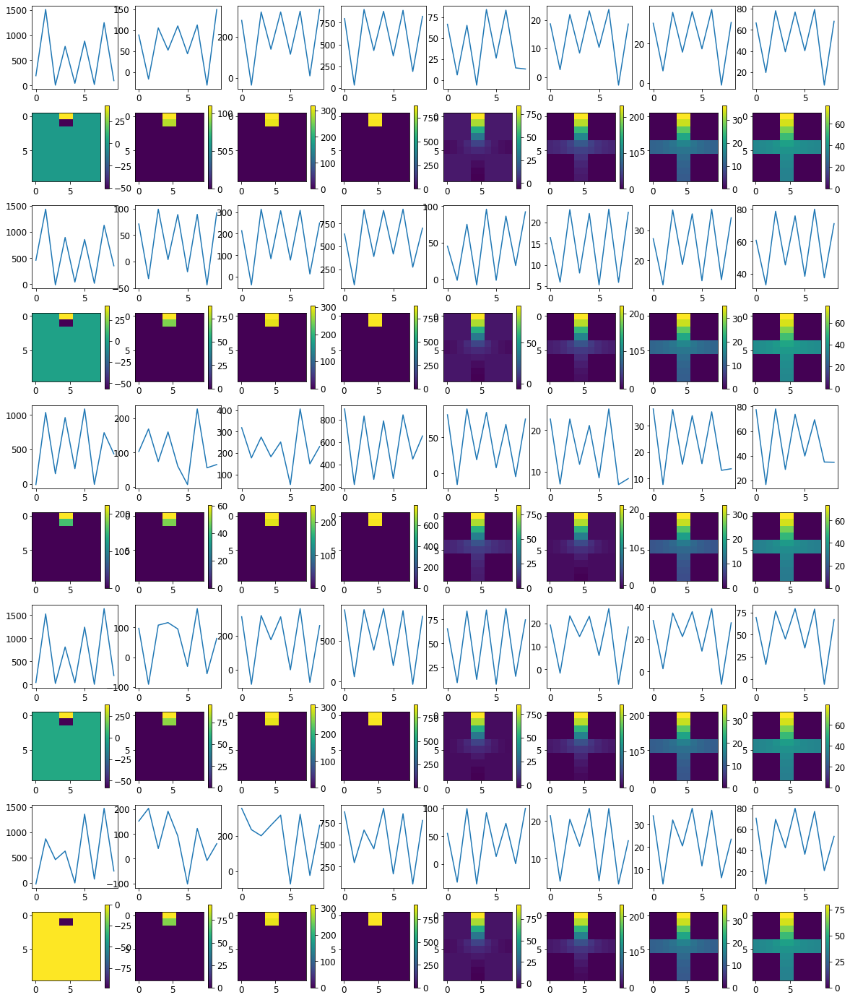

Loss: 


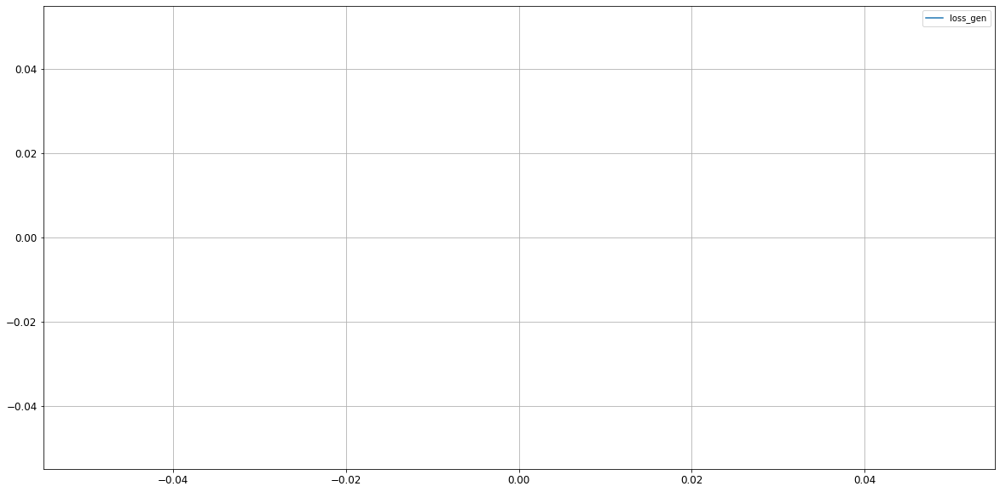

Epoch 1/20000
critic: 2279.371826 - generator: 0.364388 - 1s
disc_numpy 1314.3633
gen_numpy 0.43627894
Epoch 2/20000
critic: 1351.920532 - generator: 0.398313 - 1s
disc_numpy 968.3533
gen_numpy 0.35191458
Epoch 3/20000
critic: 1023.819946 - generator: 0.446760 - 1s
disc_numpy 656.4466
gen_numpy 0.39946777
Epoch 4/20000
critic: 665.500793 - generator: 0.481887 - 1s
disc_numpy 467.32083
gen_numpy 0.5459405
Epoch 5/20000
critic: 481.443481 - generator: 0.497459 - 1s
disc_numpy 362.4255
gen_numpy 0.52400917
Epoch 6/20000
critic: 393.819336 - generator: 0.498204 - 1s
disc_numpy 271.28586
gen_numpy 0.4711811
Epoch 7/20000
critic: 296.199554 - generator: 0.526012 - 1s
disc_numpy 206.30383
gen_numpy 0.49962232
Epoch 8/20000
critic: 240.572998 - generator: 0.505256 - 1s
disc_numpy 176.54506
gen_numpy 0.47845367
Epoch 9/20000
critic: 193.814148 - generator: 0.520615 - 1s
disc_numpy 142.35796
gen_numpy 0.57257235
Epoch 10/20000
critic: 158.307266 - generator: 0.513016 - 1s
disc_numpy 114.38331
ge

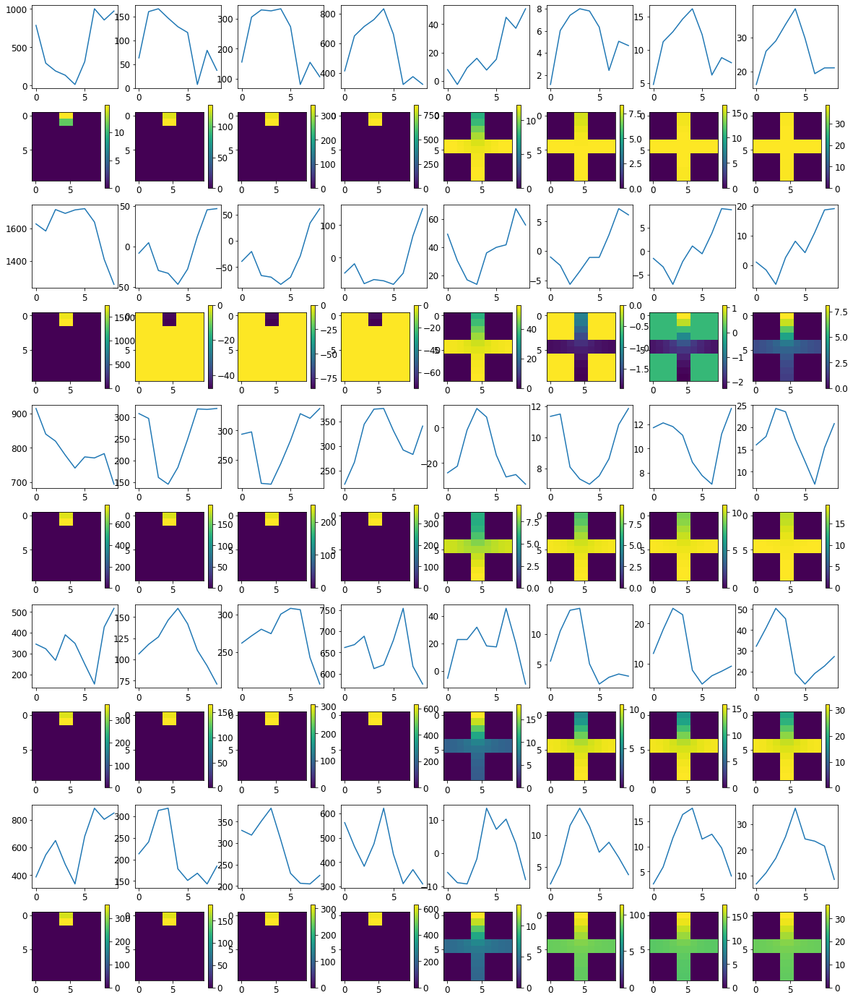

Loss: 


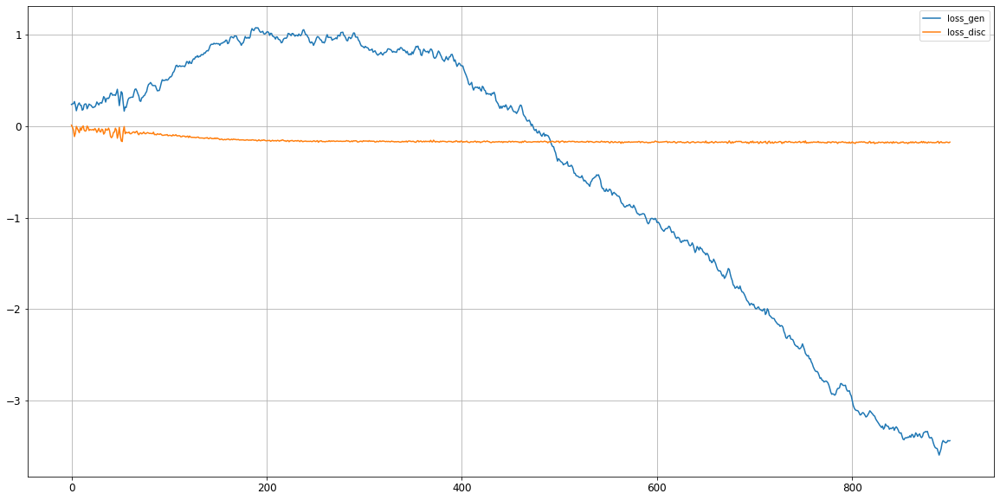

Epoch 1001/20000
critic: -0.172065 - generator: -3.455692 - 1s
disc_numpy -0.19245668
gen_numpy -3.5005286
Epoch 1002/20000
critic: -0.184536 - generator: -3.461113 - 1s
disc_numpy -0.17327122
gen_numpy -3.4959662
Epoch 1003/20000
critic: -0.175988 - generator: -3.461247 - 1s
disc_numpy -0.17748733
gen_numpy -3.500825
Epoch 1004/20000
critic: -0.189832 - generator: -3.427505 - 1s
disc_numpy -0.14592496
gen_numpy -3.4991198
Epoch 1005/20000
critic: -0.187224 - generator: -3.486293 - 1s
disc_numpy -0.18907748
gen_numpy -3.5344822
Epoch 1006/20000
critic: -0.172974 - generator: -3.505052 - 1s
disc_numpy -0.20662734
gen_numpy -3.5322585
Epoch 1007/20000
critic: -0.181475 - generator: -3.510710 - 1s
disc_numpy -0.17339337
gen_numpy -3.5741549
Epoch 1008/20000
critic: -0.178143 - generator: -3.524029 - 1s
disc_numpy -0.17883772
gen_numpy -3.5671108
Epoch 1009/20000
critic: -0.173916 - generator: -3.531688 - 1s
disc_numpy -0.18129024
gen_numpy -3.550677
Epoch 1010/20000
critic: -0.183835 - ge

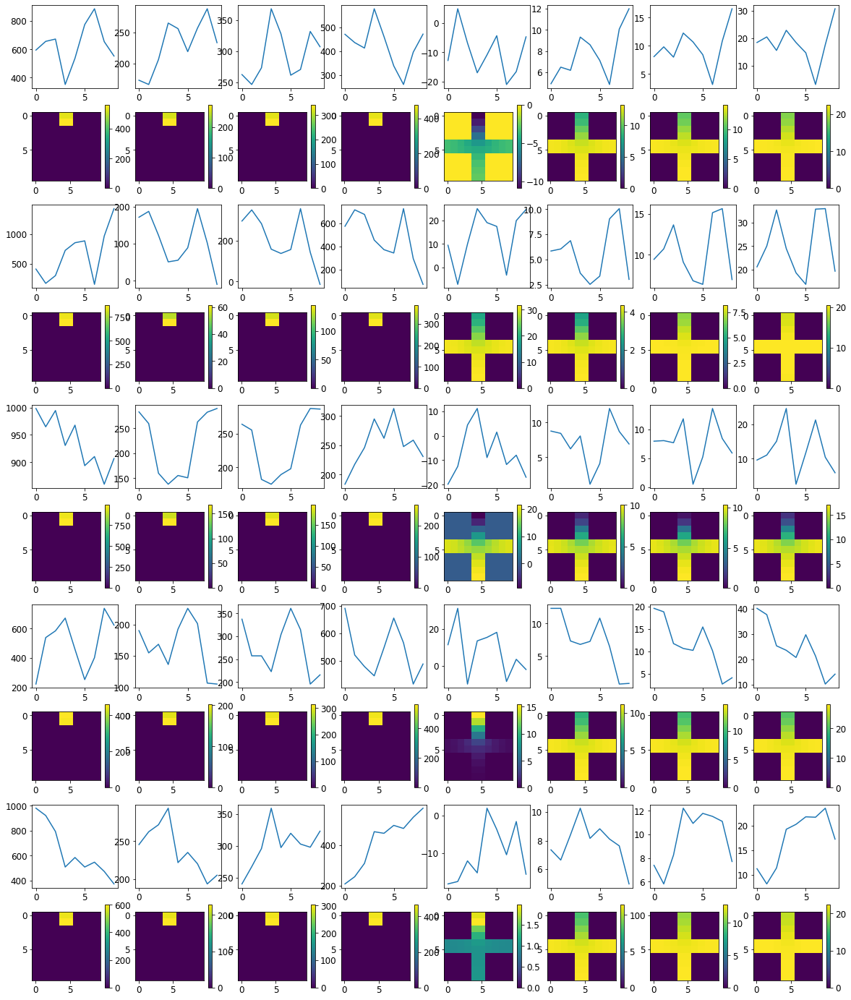

Loss: 


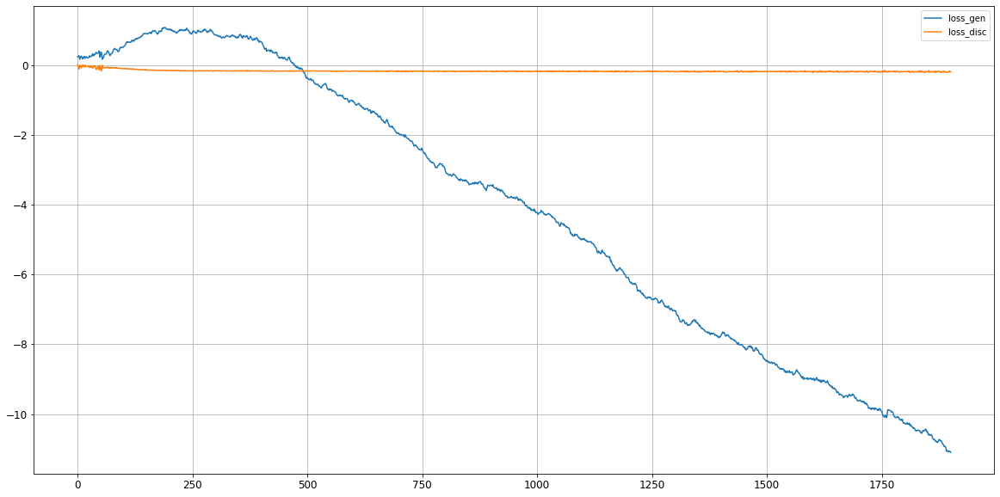

Epoch 2001/20000
critic: -0.203525 - generator: -11.124652 - 1s
disc_numpy -0.19159046
gen_numpy -11.115483
Epoch 2002/20000
critic: -0.175147 - generator: -11.103893 - 1s
disc_numpy -0.1621051
gen_numpy -11.117059
Epoch 2003/20000
critic: -0.194613 - generator: -11.113730 - 1s
disc_numpy -0.19872019
gen_numpy -11.224419
Epoch 2004/20000
critic: -0.176706 - generator: -11.113468 - 1s
disc_numpy -0.17522088
gen_numpy -11.126884
Epoch 2005/20000
critic: -0.187222 - generator: -11.082030 - 1s
disc_numpy -0.19056231
gen_numpy -11.080984
Epoch 2006/20000
critic: -0.194348 - generator: -11.071432 - 1s
disc_numpy -0.20237058
gen_numpy -11.103082
Epoch 2007/20000
critic: -0.192567 - generator: -11.084954 - 1s
disc_numpy -0.18214633
gen_numpy -11.084367
Epoch 2008/20000
critic: -0.188872 - generator: -11.112949 - 1s
disc_numpy -0.14738394
gen_numpy -11.209719
Epoch 2009/20000
critic: -0.184902 - generator: -11.129945 - 1s
disc_numpy -0.15402934
gen_numpy -11.142434
Epoch 2010/20000
critic: -0.1

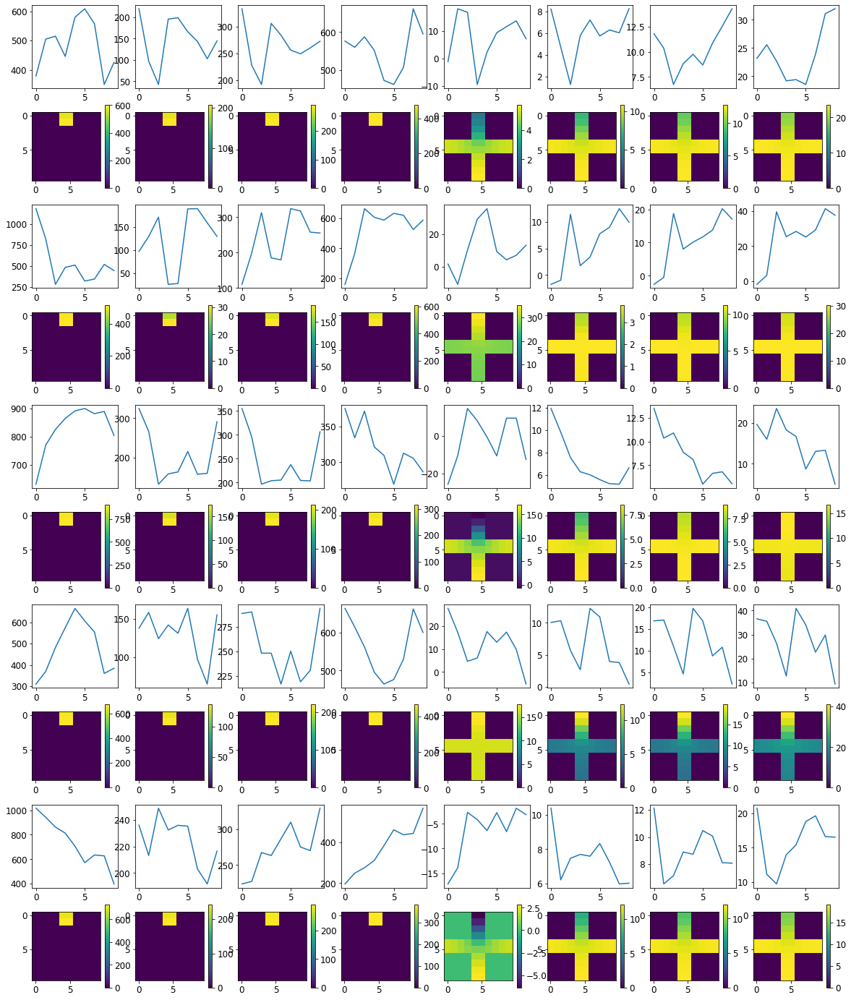

Loss: 


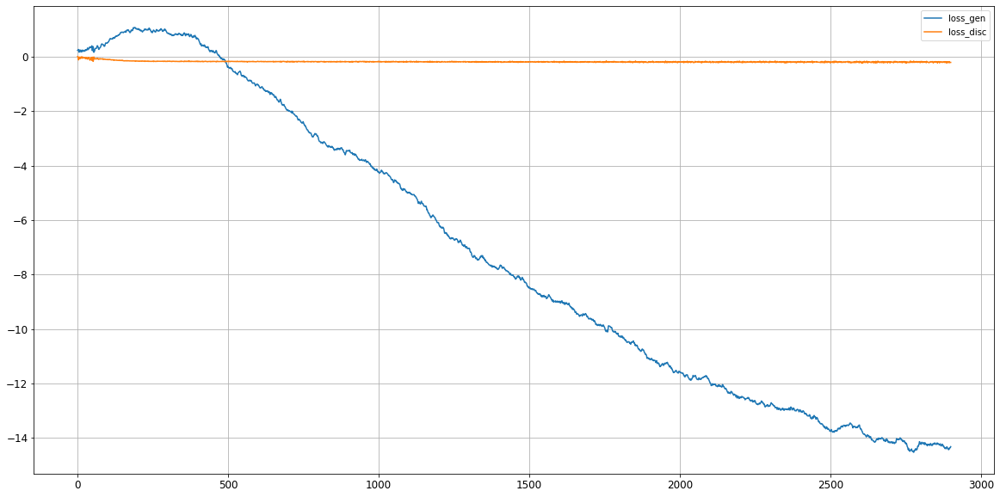

Epoch 3001/20000
critic: -0.173936 - generator: -14.330793 - 1s
disc_numpy -0.15665284
gen_numpy -14.287935
Epoch 3002/20000
critic: -0.213132 - generator: -14.335942 - 1s
disc_numpy -0.27028912
gen_numpy -14.332759
Epoch 3003/20000
critic: -0.174272 - generator: -14.301097 - 1s
disc_numpy -0.1214328
gen_numpy -14.315664
Epoch 3004/20000
critic: -0.167376 - generator: -14.285462 - 1s
disc_numpy -0.17386355
gen_numpy -14.30171
Epoch 3005/20000
critic: -0.168203 - generator: -14.312598 - 1s
disc_numpy -0.117454596
gen_numpy -14.364212
Epoch 3006/20000
critic: -0.181425 - generator: -14.313075 - 1s
disc_numpy -0.16627014
gen_numpy -14.332811
Epoch 3007/20000
critic: -0.179321 - generator: -14.327648 - 1s
disc_numpy -0.28670973
gen_numpy -14.293915
Epoch 3008/20000
critic: -0.186641 - generator: -14.332511 - 1s
disc_numpy -0.15178794
gen_numpy -14.34494
Epoch 3009/20000
critic: -0.181510 - generator: -14.308361 - 1s
disc_numpy -0.2069228
gen_numpy -14.341837
Epoch 3010/20000
critic: -0.198

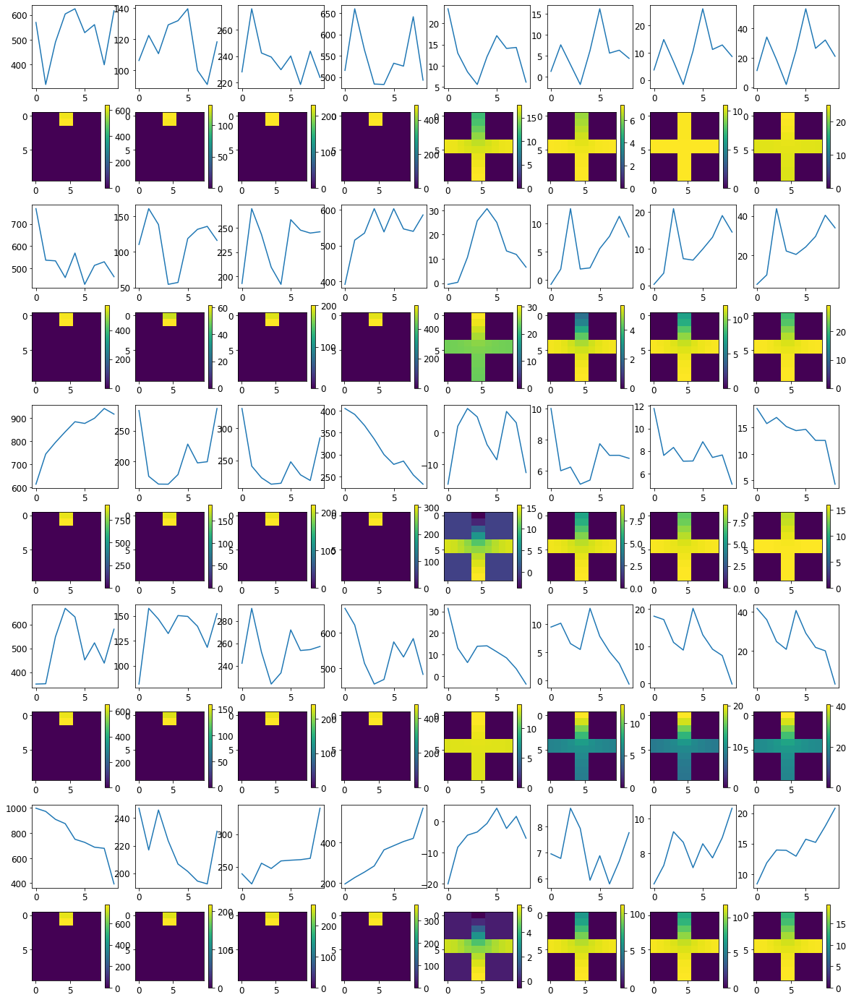

Loss: 


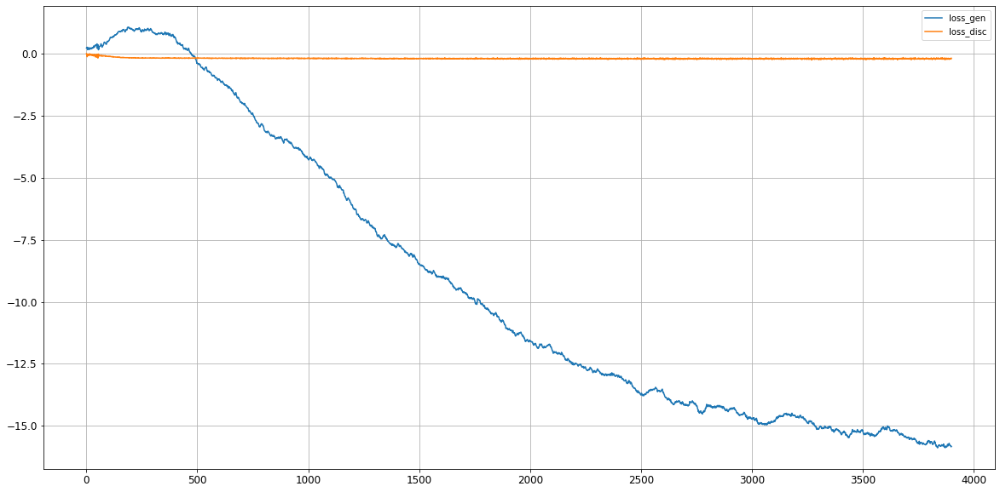

Epoch 4001/20000
critic: -0.192563 - generator: -15.862206 - 1s
disc_numpy -0.18396106
gen_numpy -16.040823
Epoch 4002/20000
critic: -0.177438 - generator: -15.864812 - 1s
disc_numpy -0.26229405
gen_numpy -15.901002
Epoch 4003/20000
critic: -0.193177 - generator: -15.872702 - 1s
disc_numpy -0.23050311
gen_numpy -15.984929
Epoch 4004/20000
critic: -0.202742 - generator: -15.853040 - 1s
disc_numpy -0.115416504
gen_numpy -15.9307575
Epoch 4005/20000
critic: -0.186290 - generator: -15.867333 - 1s
disc_numpy -0.08206605
gen_numpy -15.870191
Epoch 4006/20000
critic: -0.192389 - generator: -15.863338 - 1s
disc_numpy -0.13814995
gen_numpy -15.882473
Epoch 4007/20000
critic: -0.185642 - generator: -15.856702 - 1s
disc_numpy -0.062462293
gen_numpy -15.9092045
Epoch 4008/20000
critic: -0.208187 - generator: -15.865052 - 1s
disc_numpy -0.29091159
gen_numpy -15.990625
Epoch 4009/20000
critic: -0.199092 - generator: -15.910853 - 1s
disc_numpy -0.27720332
gen_numpy -15.929416
Epoch 4010/20000
critic:

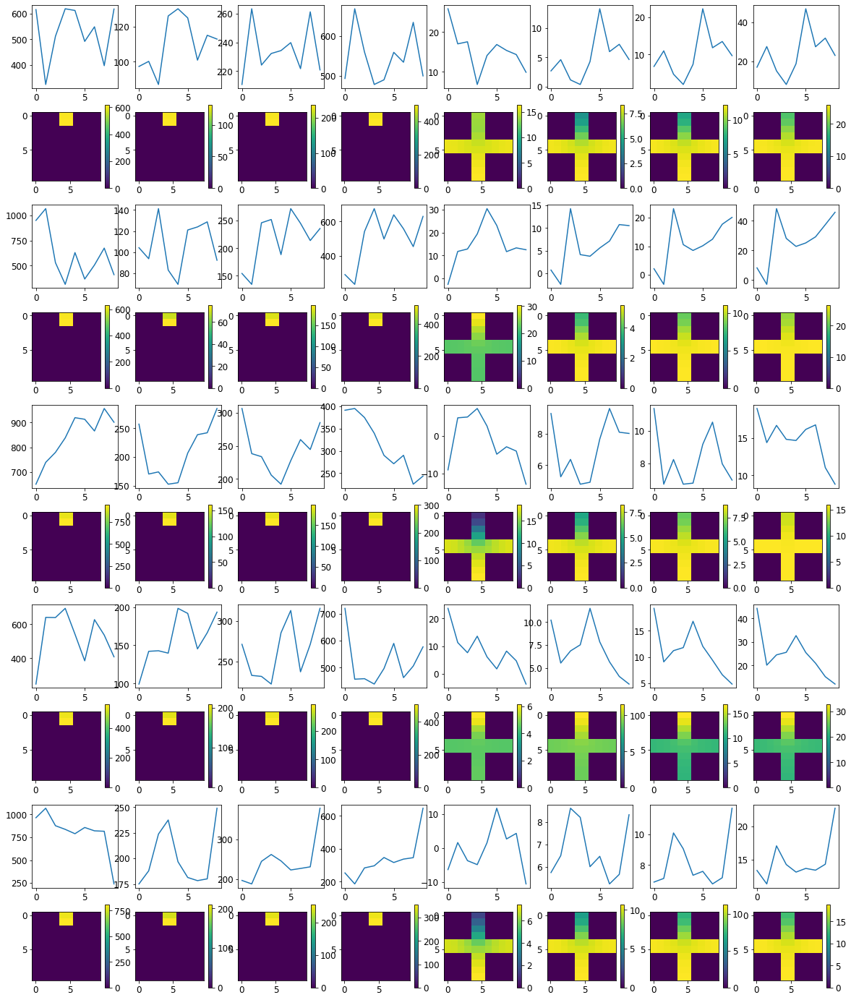

Loss: 


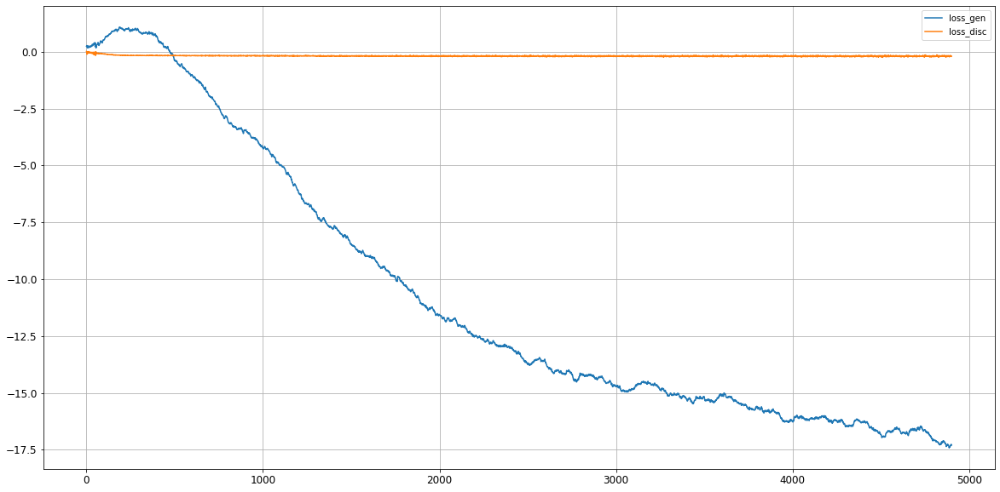

Epoch 5001/20000
critic: -0.181918 - generator: -17.329266 - 1s
disc_numpy -0.1804401
gen_numpy -17.355207
Epoch 5002/20000
critic: -0.188400 - generator: -17.336353 - 1s
disc_numpy -0.09398562
gen_numpy -17.389603
Epoch 5003/20000
critic: -0.174258 - generator: -17.318016 - 1s
disc_numpy -0.20359083
gen_numpy -17.41158
Epoch 5004/20000
critic: -0.178312 - generator: -17.316566 - 1s
disc_numpy -0.1858789
gen_numpy -17.399069
Epoch 5005/20000
critic: -0.198661 - generator: -17.314039 - 1s
disc_numpy -0.316699
gen_numpy -17.351238
Epoch 5006/20000
critic: -0.201287 - generator: -17.327833 - 1s
disc_numpy -0.22528227
gen_numpy -17.281887
Epoch 5007/20000
critic: -0.189141 - generator: -17.328016 - 1s
disc_numpy -0.32252014
gen_numpy -17.497908
Epoch 5008/20000
critic: -0.185577 - generator: -17.330950 - 1s
disc_numpy -0.24421807
gen_numpy -17.392235
Epoch 5009/20000
critic: -0.203055 - generator: -17.353056 - 1s
disc_numpy -0.08861078
gen_numpy -17.34297
Epoch 5010/20000
critic: -0.194193

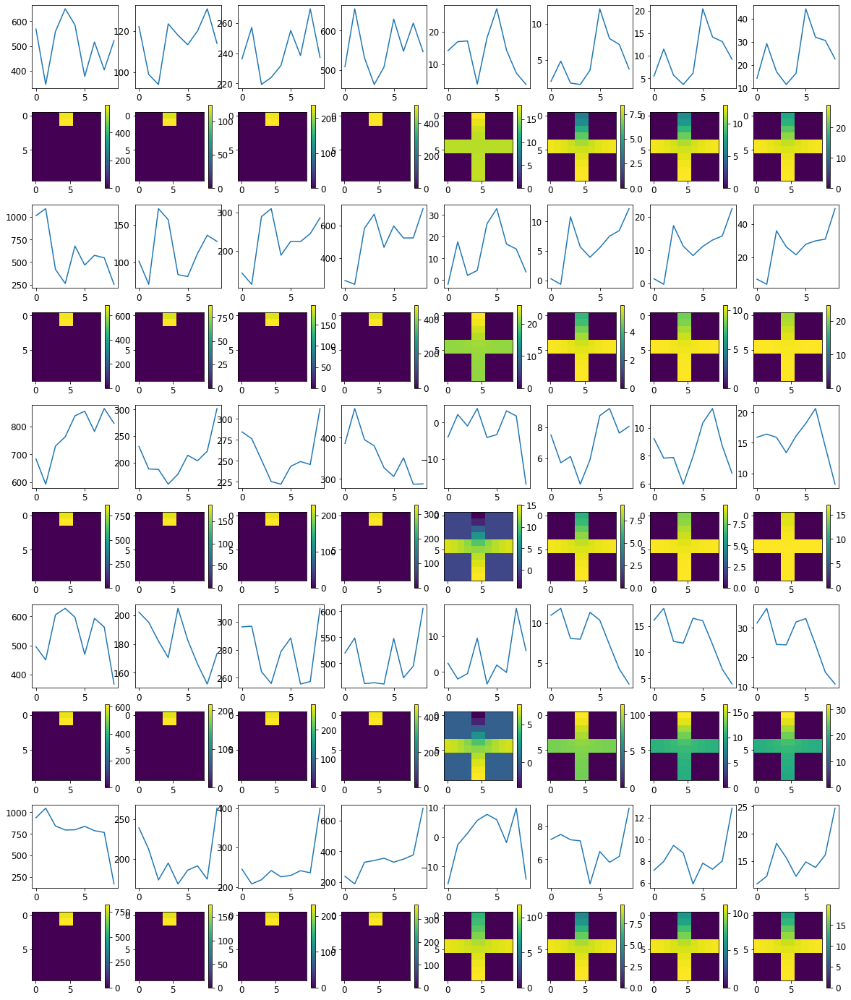

Loss: 


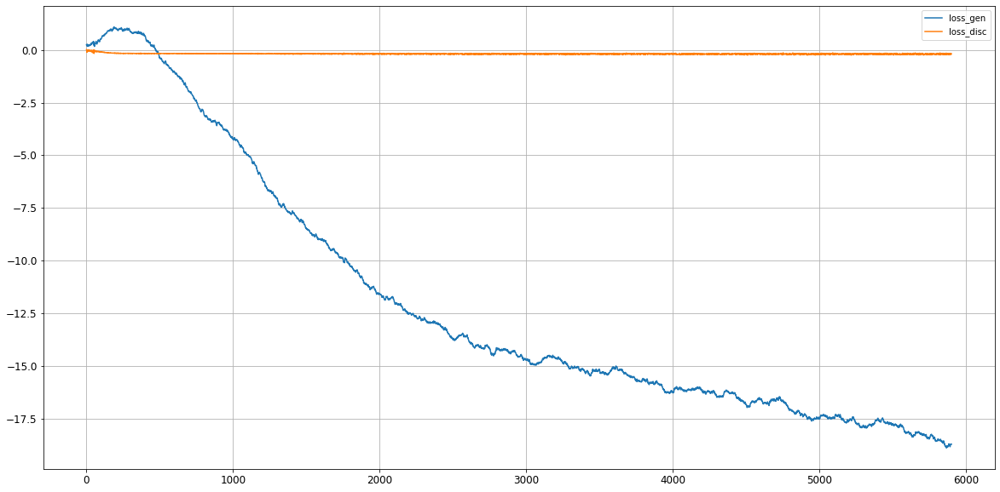

Epoch 6001/20000
critic: -0.164745 - generator: -18.724224 - 1s
disc_numpy -0.15893109
gen_numpy -18.719748
Epoch 6002/20000
critic: -0.193966 - generator: -18.713259 - 1s
disc_numpy -0.18399037
gen_numpy -18.688557
Epoch 6003/20000
critic: -0.187060 - generator: -18.684143 - 1s
disc_numpy -0.24474035
gen_numpy -18.770615
Epoch 6004/20000
critic: -0.175895 - generator: -18.712582 - 1s
disc_numpy -0.13521528
gen_numpy -18.78151
Epoch 6005/20000
critic: -0.217703 - generator: -18.712927 - 1s
disc_numpy -0.22647646
gen_numpy -18.722324
Epoch 6006/20000
critic: -0.199544 - generator: -18.709314 - 1s
disc_numpy -0.07505277
gen_numpy -18.717411
Epoch 6007/20000
critic: -0.184812 - generator: -18.659328 - 1s
disc_numpy -0.32229662
gen_numpy -18.707737
Epoch 6008/20000
critic: -0.214118 - generator: -18.655769 - 1s
disc_numpy -0.35526597
gen_numpy -18.709051
Epoch 6009/20000
critic: -0.206749 - generator: -18.657539 - 1s
disc_numpy -0.21707837
gen_numpy -18.646988
Epoch 6010/20000
critic: -0.2

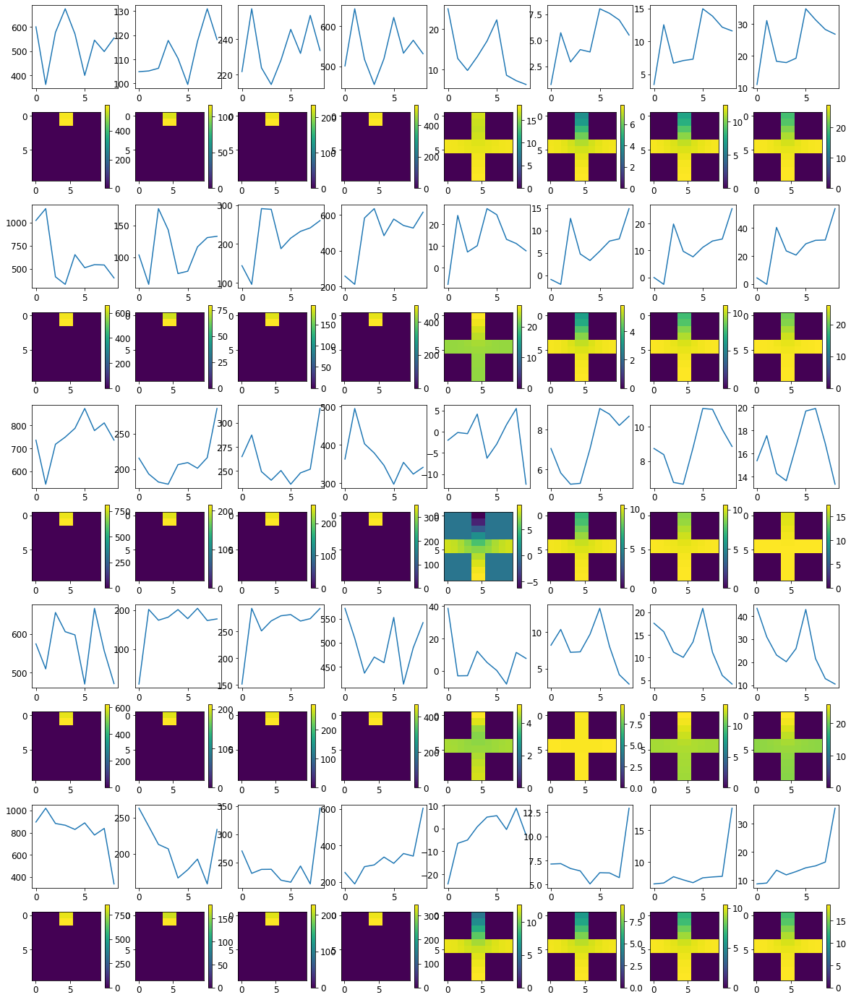

Loss: 


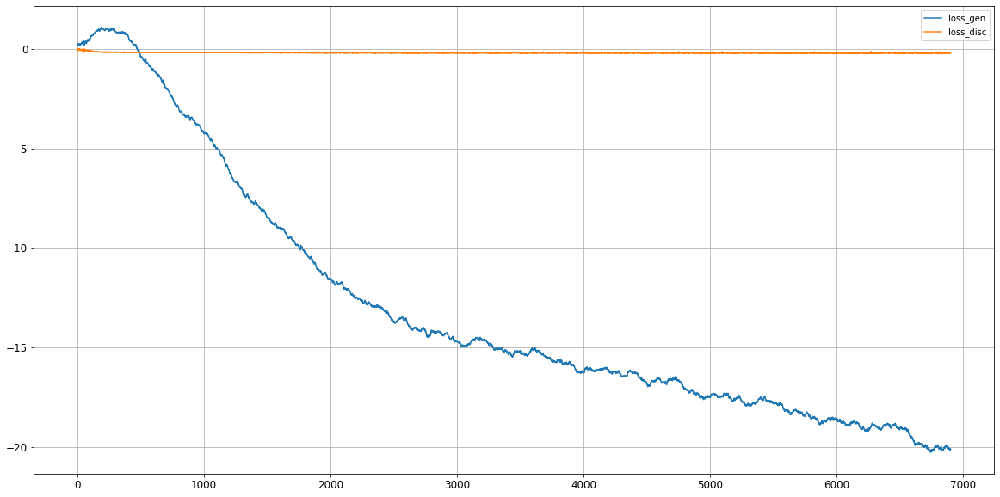

Epoch 7001/20000
critic: -0.217690 - generator: -20.087152 - 1s
disc_numpy -0.16552678
gen_numpy -20.112175
Epoch 7002/20000
critic: -0.202875 - generator: -20.089735 - 1s
disc_numpy -0.16136864
gen_numpy -20.136189
Epoch 7003/20000
critic: -0.199149 - generator: -20.096458 - 1s
disc_numpy -0.2719014
gen_numpy -20.180048
Epoch 7004/20000
critic: -0.158947 - generator: -20.115986 - 1s
disc_numpy -0.03659466
gen_numpy -20.156816
Epoch 7005/20000
critic: -0.210503 - generator: -20.097105 - 1s
disc_numpy -0.10015876
gen_numpy -20.149305
Epoch 7006/20000
critic: -0.229749 - generator: -20.122631 - 1s
disc_numpy -0.22999878
gen_numpy -20.164597
Epoch 7007/20000
critic: -0.209565 - generator: -20.087036 - 1s
disc_numpy -0.2539485
gen_numpy -20.171656
Epoch 7008/20000
critic: -0.178416 - generator: -20.110046 - 1s
disc_numpy -0.17625913
gen_numpy -20.080912
Epoch 7009/20000
critic: -0.218062 - generator: -20.096842 - 1s
disc_numpy -0.24187961
gen_numpy -20.190973
Epoch 7010/20000
critic: -0.17

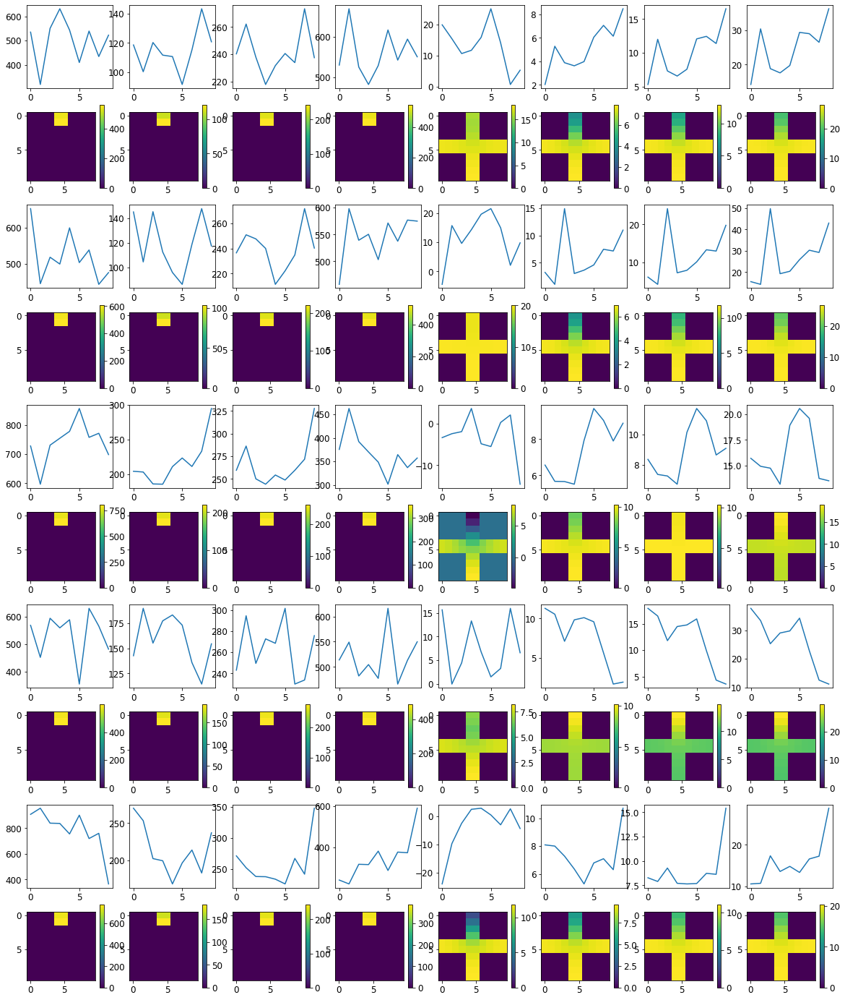

Loss: 


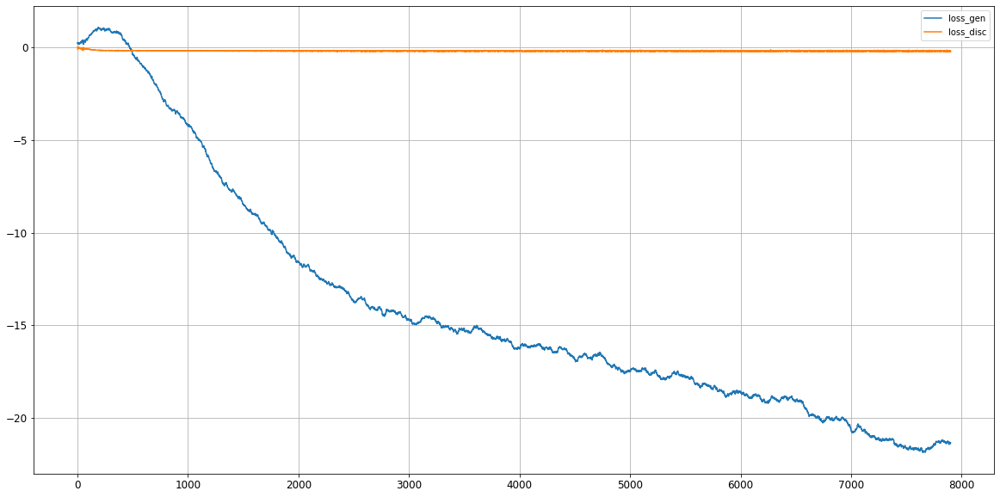

Epoch 8001/20000
critic: -0.213916 - generator: -21.343468 - 1s
disc_numpy -0.19476652
gen_numpy -21.421888
Epoch 8002/20000
critic: -0.204914 - generator: -21.347301 - 1s
disc_numpy -0.16459443
gen_numpy -21.496515
Epoch 8003/20000
critic: -0.206472 - generator: -21.370199 - 1s
disc_numpy -0.25335085
gen_numpy -21.45747
Epoch 8004/20000
critic: -0.182804 - generator: -21.432962 - 1s
disc_numpy -0.18773057
gen_numpy -21.435524
Epoch 8005/20000
critic: -0.214498 - generator: -21.419151 - 1s
disc_numpy -0.19911075
gen_numpy -21.491596
Epoch 8006/20000
critic: -0.161070 - generator: -21.400661 - 1s
disc_numpy -0.13745771
gen_numpy -21.393843
Epoch 8007/20000
critic: -0.209748 - generator: -21.415903 - 1s
disc_numpy -0.10405163
gen_numpy -21.453651
Epoch 8008/20000
critic: -0.189390 - generator: -21.415621 - 1s
disc_numpy 0.031573437
gen_numpy -21.466858
Epoch 8009/20000
critic: -0.179815 - generator: -21.446659 - 1s
disc_numpy -0.25737566
gen_numpy -21.54654
Epoch 8010/20000
critic: -0.16

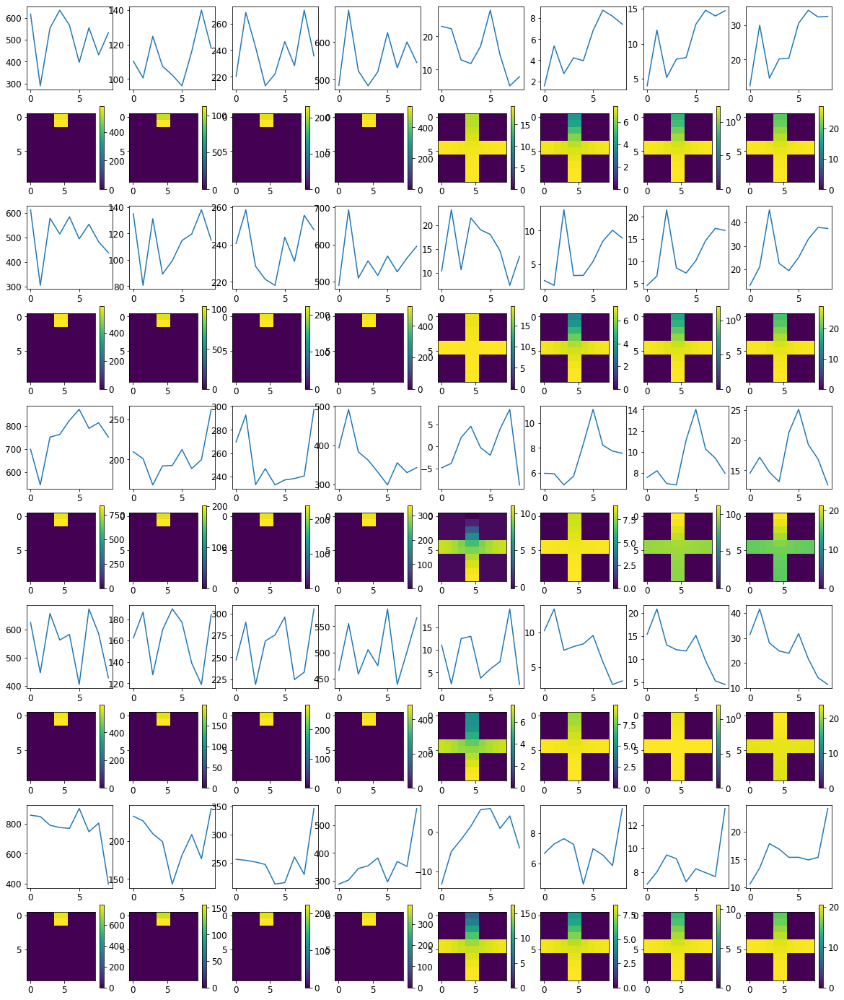

Loss: 


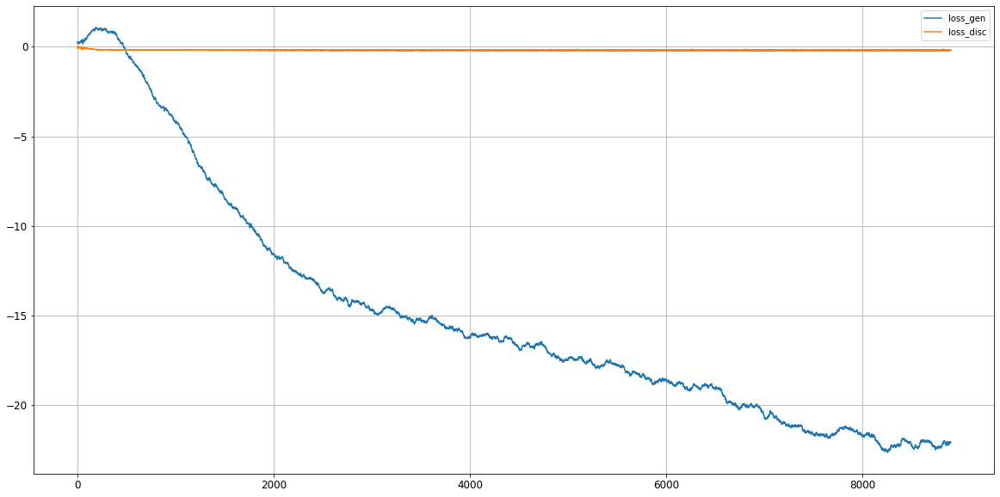

Epoch 9001/20000
critic: -0.209799 - generator: -22.101847 - 1s
disc_numpy -0.1896364
gen_numpy -22.083172
Epoch 9002/20000
critic: -0.216527 - generator: -22.088957 - 1s
disc_numpy -0.27166092
gen_numpy -22.123976
Epoch 9003/20000
critic: -0.191553 - generator: -22.124439 - 1s
disc_numpy -0.18084681
gen_numpy -22.135569
Epoch 9004/20000
critic: -0.218150 - generator: -22.189178 - 1s
disc_numpy -0.2376139
gen_numpy -22.223164
Epoch 9005/20000
critic: -0.174117 - generator: -22.161949 - 1s
disc_numpy -0.15689678
gen_numpy -22.207367
Epoch 9006/20000
critic: -0.175229 - generator: -22.120554 - 1s
disc_numpy -0.10121972
gen_numpy -22.243734
Epoch 9007/20000
critic: -0.199749 - generator: -22.142254 - 1s
disc_numpy -0.09858776
gen_numpy -22.250874
Epoch 9008/20000
critic: -0.205791 - generator: -22.126650 - 1s
disc_numpy -0.07245088
gen_numpy -22.179586
Epoch 9009/20000
critic: -0.183979 - generator: -22.093136 - 1s
disc_numpy -0.18875024
gen_numpy -22.022074
Epoch 9010/20000
critic: -0.18

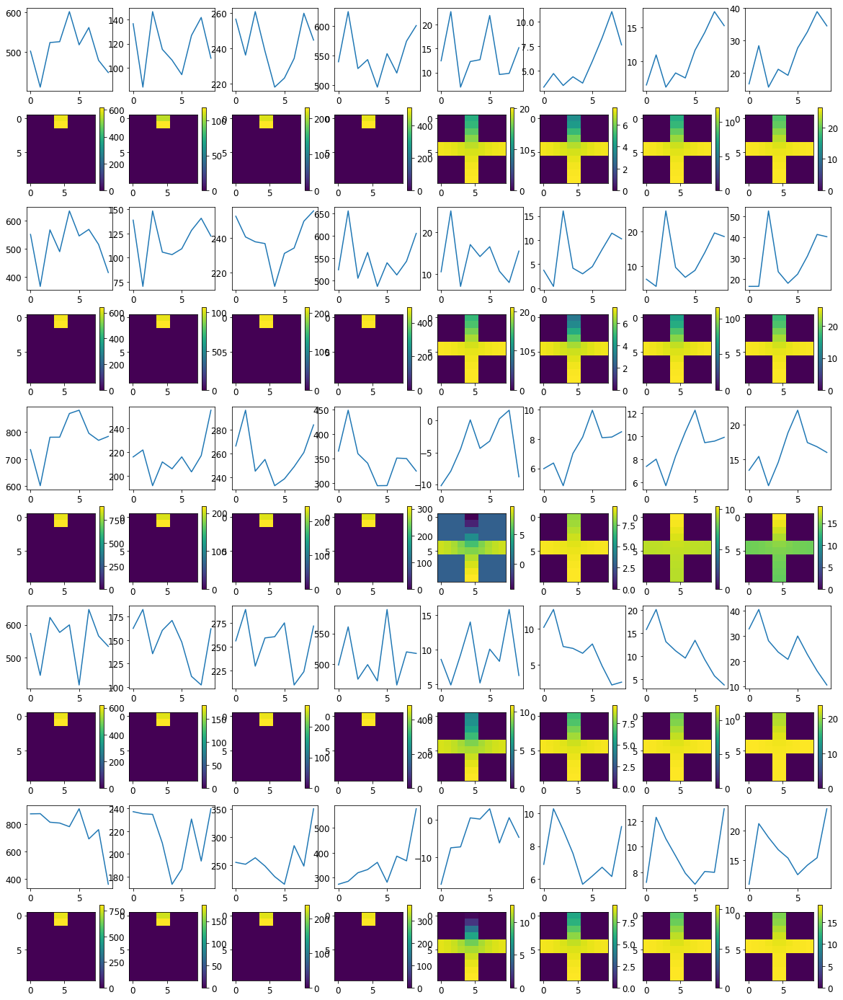

Loss: 


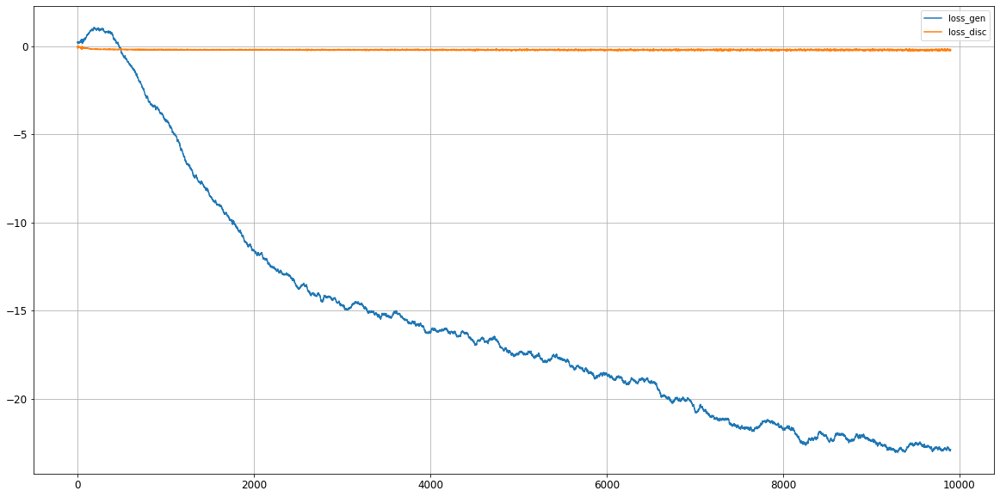

Epoch 10001/20000
critic: -0.178820 - generator: -22.845743 - 1s
disc_numpy -0.16282722
gen_numpy -23.022026
Epoch 10002/20000
critic: -0.179061 - generator: -22.841135 - 1s
disc_numpy -0.19714488
gen_numpy -22.84831
Epoch 10003/20000
critic: -0.217561 - generator: -22.815334 - 1s
disc_numpy -0.25572836
gen_numpy -22.824587
Epoch 10004/20000
critic: -0.229367 - generator: -22.797483 - 1s
disc_numpy -0.19249612
gen_numpy -22.850769
Epoch 10005/20000
critic: -0.258746 - generator: -22.766985 - 1s
disc_numpy -0.090538956
gen_numpy -22.808481
Epoch 10006/20000
critic: -0.218853 - generator: -22.809288 - 1s
disc_numpy -0.18755883
gen_numpy -22.876898
Epoch 10007/20000
critic: -0.175333 - generator: -22.839355 - 1s
disc_numpy -0.28086096
gen_numpy -22.760014
Epoch 10008/20000
critic: -0.219484 - generator: -22.853359 - 1s
disc_numpy -0.25371796
gen_numpy -22.969536
Epoch 10009/20000
critic: -0.208784 - generator: -22.865631 - 1s
disc_numpy -0.15634581
gen_numpy -23.001509
Epoch 10010/20000
c

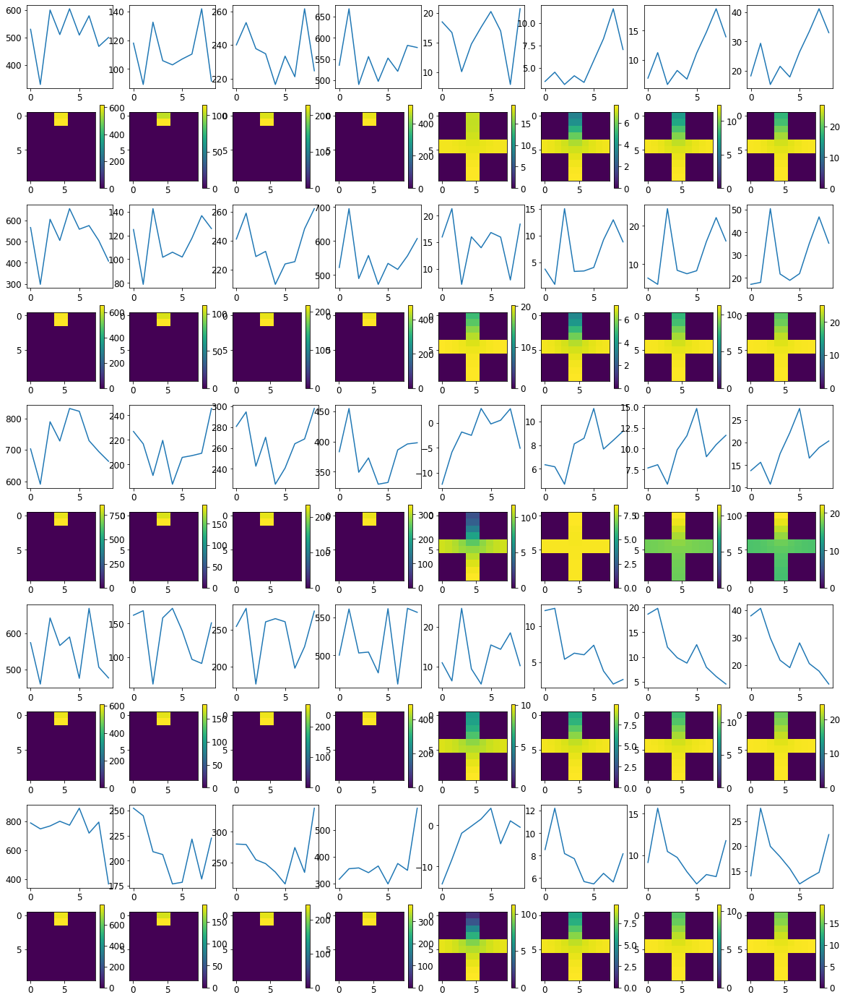

Loss: 


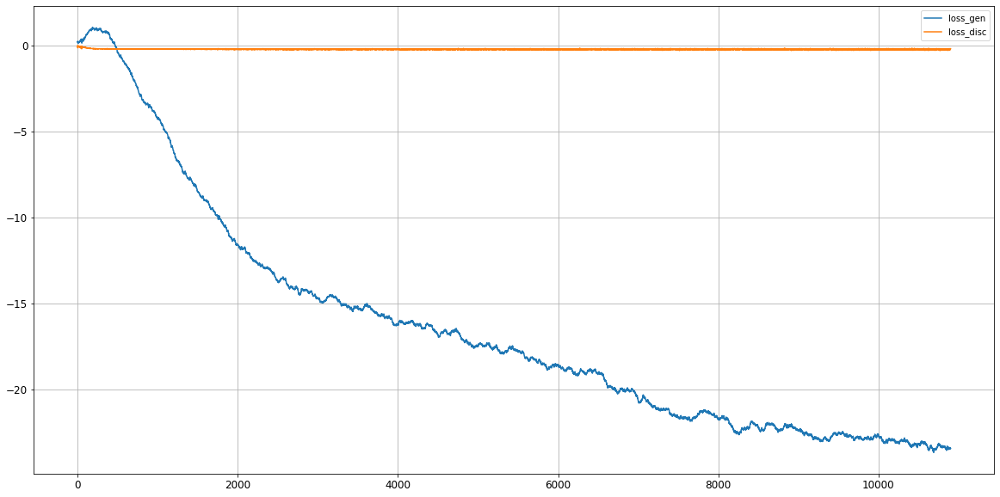

Epoch 11001/20000
critic: -0.236151 - generator: -23.410070 - 1s
disc_numpy -0.24785024
gen_numpy -23.352188
Epoch 11002/20000
critic: -0.209795 - generator: -23.402220 - 1s
disc_numpy -0.32019177
gen_numpy -23.579067
Epoch 11003/20000
critic: -0.208591 - generator: -23.418018 - 1s
disc_numpy -0.06869002
gen_numpy -23.421505
Epoch 11004/20000
critic: -0.242614 - generator: -23.428087 - 1s
disc_numpy -0.2759103
gen_numpy -23.451769
Epoch 11005/20000
critic: -0.194074 - generator: -23.452490 - 1s
disc_numpy -0.116126046
gen_numpy -23.495584
Epoch 11006/20000
critic: -0.190808 - generator: -23.439104 - 1s
disc_numpy -0.16791654
gen_numpy -23.543116
Epoch 11007/20000
critic: -0.187963 - generator: -23.400818 - 1s
disc_numpy -0.23715031
gen_numpy -23.397625
Epoch 11008/20000
critic: -0.196101 - generator: -23.426670 - 1s
disc_numpy -0.1807198
gen_numpy -23.470173
Epoch 11009/20000
critic: -0.184659 - generator: -23.374765 - 1s
disc_numpy -0.26123813
gen_numpy -23.374508
Epoch 11010/20000
cr

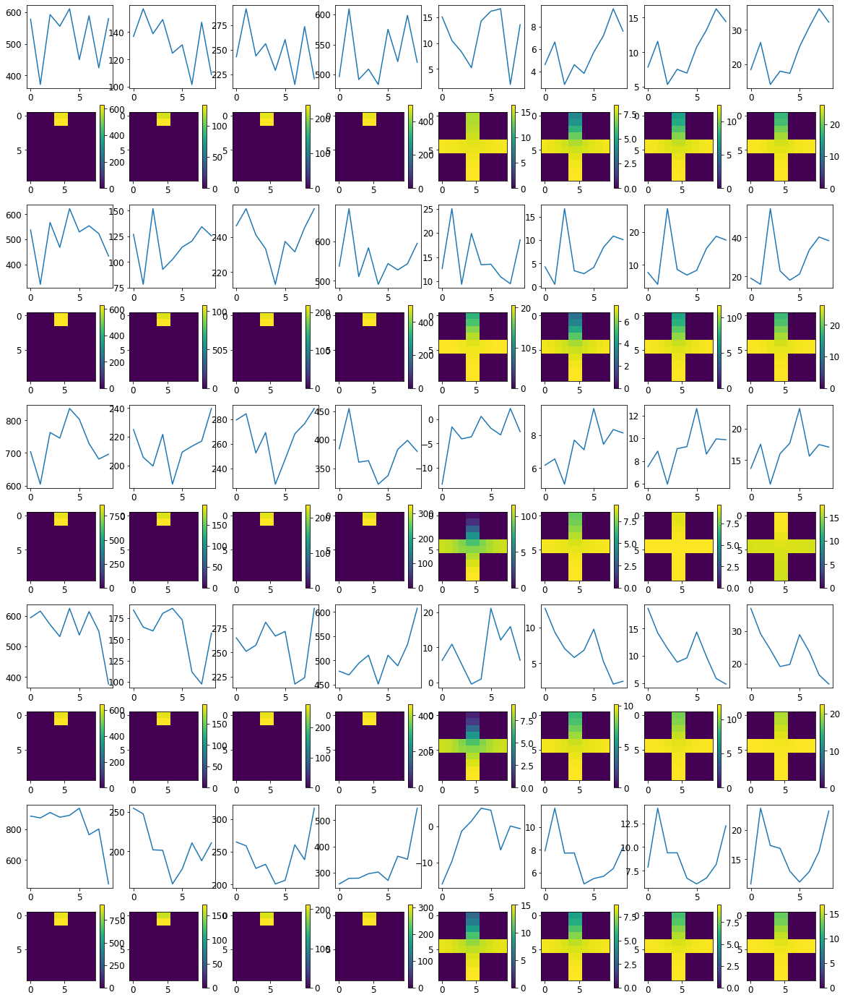

Loss: 


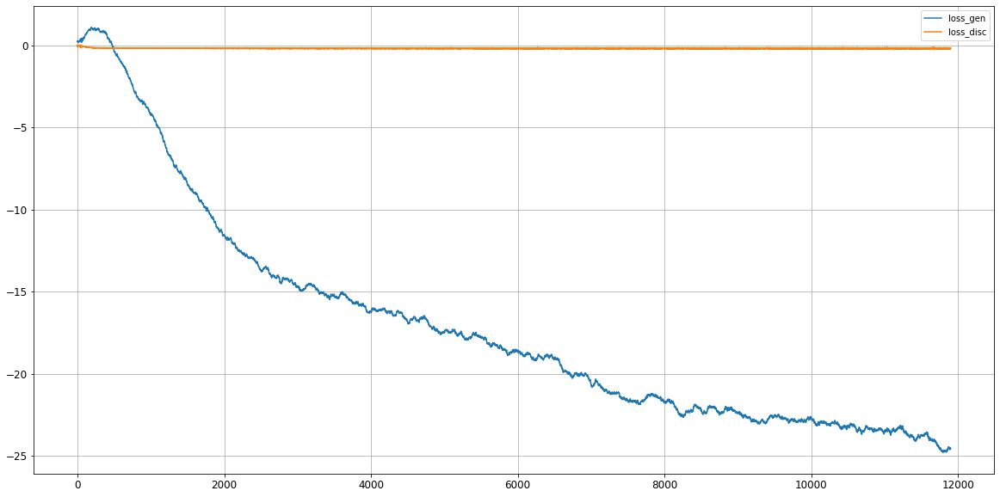

Epoch 12001/20000
critic: -0.224474 - generator: -24.596888 - 1s
disc_numpy -0.34280124
gen_numpy -24.601315
Epoch 12002/20000
critic: -0.206369 - generator: -24.562304 - 1s
disc_numpy -0.31420848
gen_numpy -24.498816
Epoch 12003/20000
critic: -0.188438 - generator: -24.511528 - 1s
disc_numpy -0.18547899
gen_numpy -24.564245
Epoch 12004/20000
critic: -0.181007 - generator: -24.586523 - 1s
disc_numpy -0.17714348
gen_numpy -24.76703
Epoch 12005/20000
critic: -0.167016 - generator: -24.627129 - 1s
disc_numpy -0.17109855
gen_numpy -24.570246
Epoch 12006/20000
critic: -0.160953 - generator: -24.612375 - 1s
disc_numpy 0.006408913
gen_numpy -24.77352
Epoch 12007/20000
critic: -0.228569 - generator: -24.605295 - 1s
disc_numpy -0.1478023
gen_numpy -24.677088
Epoch 12008/20000
critic: -0.180217 - generator: -24.570118 - 1s
disc_numpy -0.20601507
gen_numpy -24.700148
Epoch 12009/20000
critic: -0.191604 - generator: -24.543446 - 1s
disc_numpy 0.05623722
gen_numpy -24.629683
Epoch 12010/20000
criti

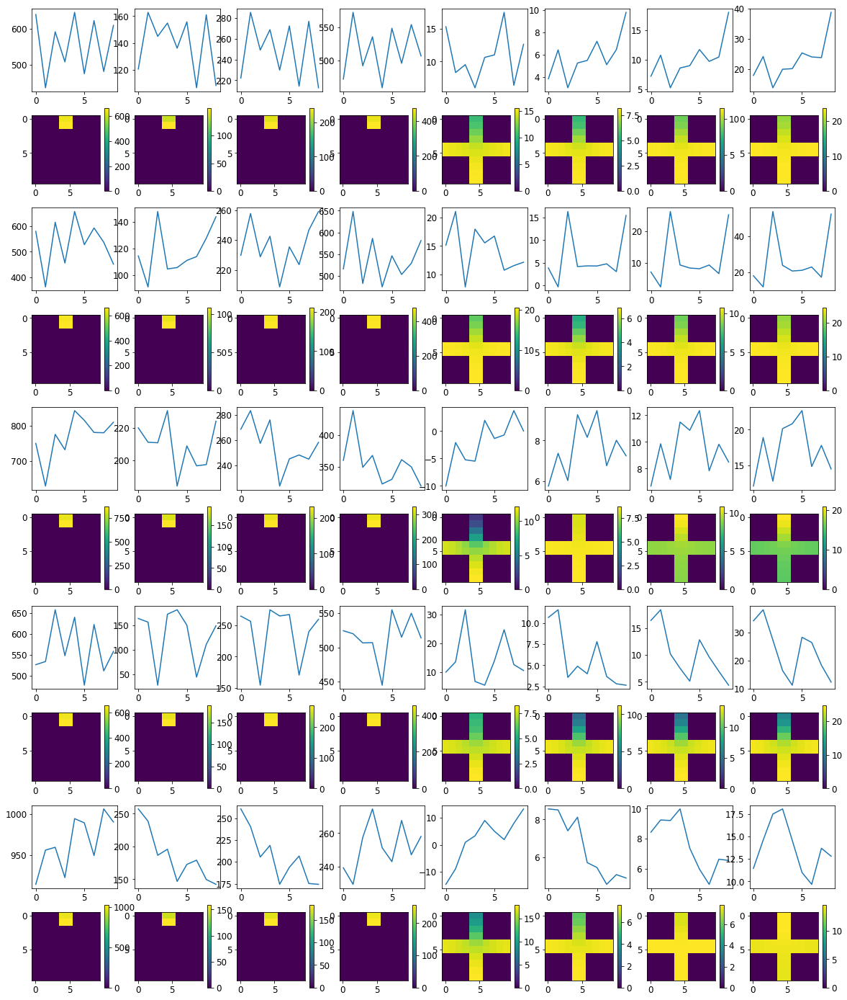

Loss: 


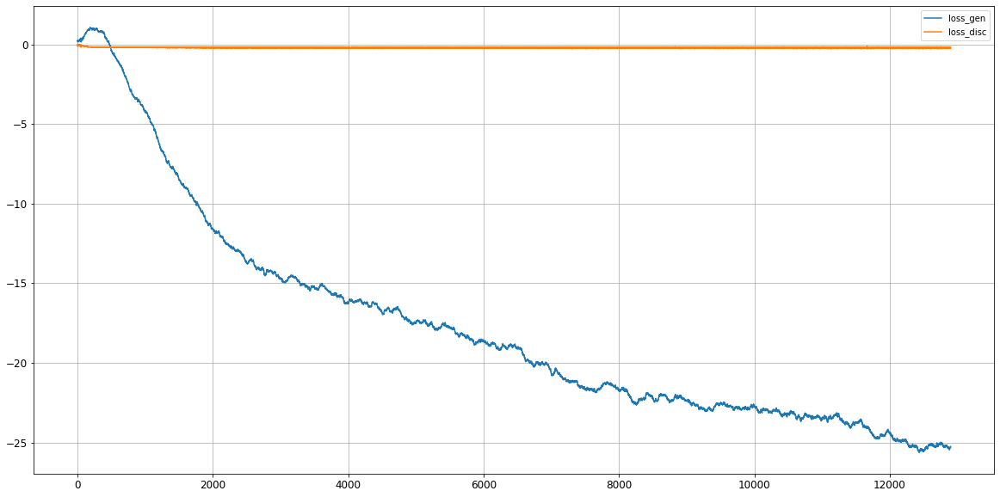

Epoch 13001/20000
critic: -0.190147 - generator: -25.281864 - 1s
disc_numpy -0.10272709
gen_numpy -25.30176
Epoch 13002/20000
critic: -0.216469 - generator: -25.324995 - 1s
disc_numpy -0.039011586
gen_numpy -25.447496
Epoch 13003/20000
critic: -0.160160 - generator: -25.378460 - 1s
disc_numpy -0.16334996
gen_numpy -25.490639
Epoch 13004/20000
critic: -0.210383 - generator: -25.397533 - 1s
disc_numpy -0.42935055
gen_numpy -25.468819
Epoch 13005/20000
critic: -0.206362 - generator: -25.402035 - 1s
disc_numpy -0.23817523
gen_numpy -25.344835
Epoch 13006/20000
critic: -0.161430 - generator: -25.428289 - 1s
disc_numpy -0.053854804
gen_numpy -25.54596
Epoch 13007/20000
critic: -0.217997 - generator: -25.450142 - 1s
disc_numpy -0.25774541
gen_numpy -25.519663
Epoch 13008/20000
critic: -0.225719 - generator: -25.447172 - 1s
disc_numpy -0.2331461
gen_numpy -25.456404
Epoch 13009/20000
critic: -0.209601 - generator: -25.458826 - 1s
disc_numpy -0.21620286
gen_numpy -25.42797
Epoch 13010/20000
cri

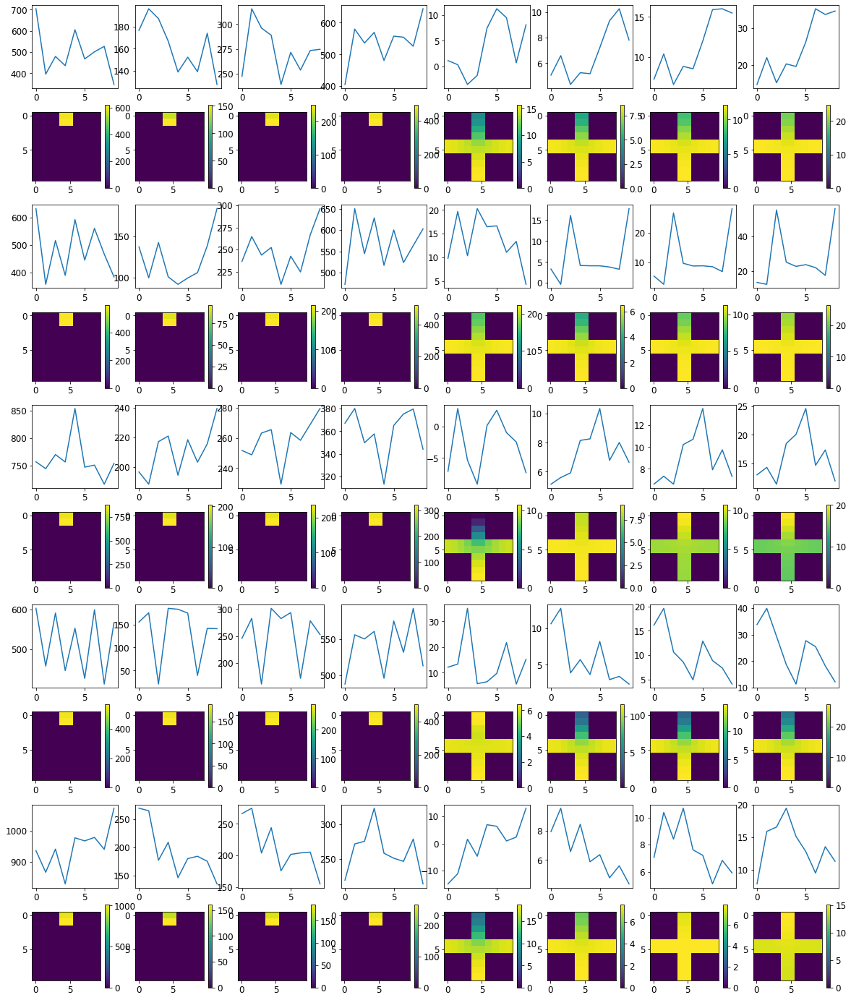

Loss: 


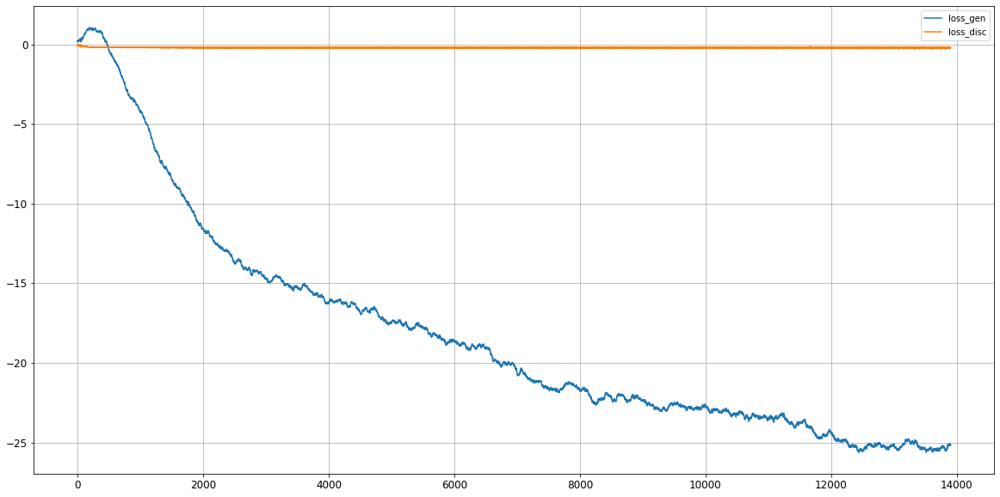

Epoch 14001/20000
critic: -0.199766 - generator: -25.185194 - 1s
disc_numpy -0.030847393
gen_numpy -25.222387
Epoch 14002/20000
critic: -0.178870 - generator: -25.189932 - 1s
disc_numpy -0.077399984
gen_numpy -25.213434
Epoch 14003/20000
critic: -0.152130 - generator: -25.136539 - 1s
disc_numpy -0.16768305
gen_numpy -25.235058
Epoch 14004/20000
critic: -0.255467 - generator: -25.144779 - 1s
disc_numpy -0.16020982
gen_numpy -25.126259
Epoch 14005/20000
critic: -0.189595 - generator: -25.153360 - 1s
disc_numpy 0.00572297
gen_numpy -25.1514
Epoch 14006/20000
critic: -0.234258 - generator: -25.190252 - 1s
disc_numpy -0.3110065
gen_numpy -25.097742
Epoch 14007/20000
critic: -0.198831 - generator: -25.198202 - 1s
disc_numpy -0.07060774
gen_numpy -25.259077
Epoch 14008/20000
critic: -0.214541 - generator: -25.205778 - 1s
disc_numpy -0.16485718
gen_numpy -25.255922
Epoch 14009/20000
critic: -0.154184 - generator: -25.192467 - 1s
disc_numpy -0.23118025
gen_numpy -25.15375
Epoch 14010/20000
crit

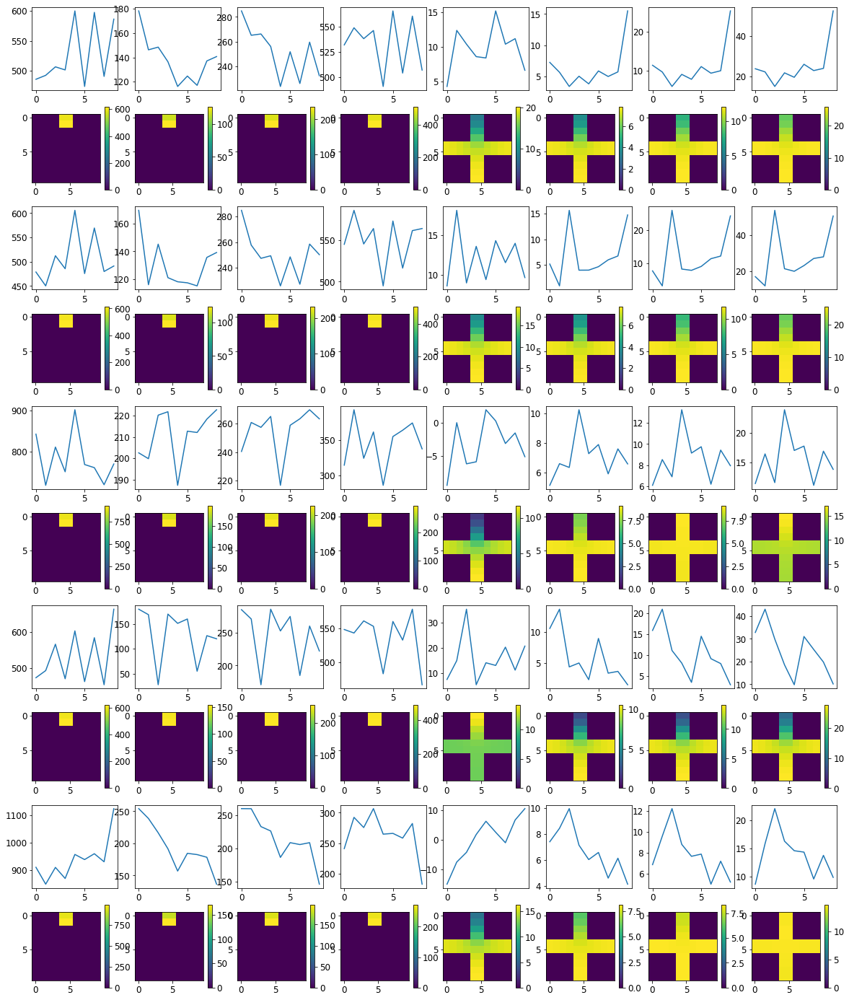

Loss: 


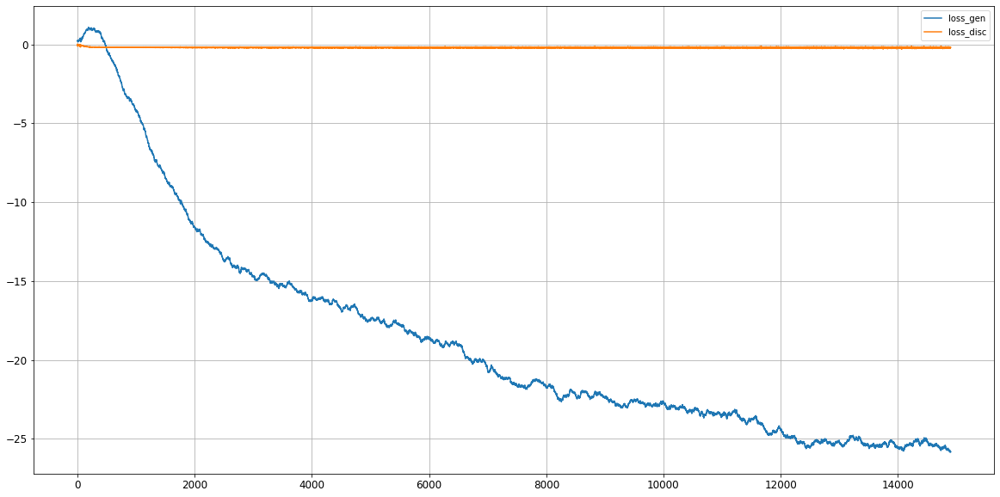

Epoch 15001/20000
critic: -0.229376 - generator: -25.828794 - 1s
disc_numpy -0.13128658
gen_numpy -25.798906
Epoch 15002/20000
critic: -0.154181 - generator: -25.819710 - 1s
disc_numpy -0.06659132
gen_numpy -25.872023
Epoch 15003/20000
critic: -0.201833 - generator: -25.812162 - 1s
disc_numpy -0.254244
gen_numpy -25.802607
Epoch 15004/20000
critic: -0.216598 - generator: -25.789307 - 1s
disc_numpy -0.21435103
gen_numpy -25.766098
Epoch 15005/20000
critic: -0.169550 - generator: -25.780500 - 1s
disc_numpy -0.25501817
gen_numpy -25.91376
Epoch 15006/20000
critic: -0.240082 - generator: -25.764971 - 1s
disc_numpy -0.33040556
gen_numpy -25.972998
Epoch 15007/20000
critic: -0.220625 - generator: -25.785442 - 1s
disc_numpy -0.088648066
gen_numpy -25.933119
Epoch 15008/20000
critic: -0.201189 - generator: -25.823046 - 1s
disc_numpy -0.23474216
gen_numpy -26.0333
Epoch 15009/20000
critic: -0.196326 - generator: -25.779531 - 1s
disc_numpy -0.19985434
gen_numpy -25.783834
Epoch 15010/20000
criti

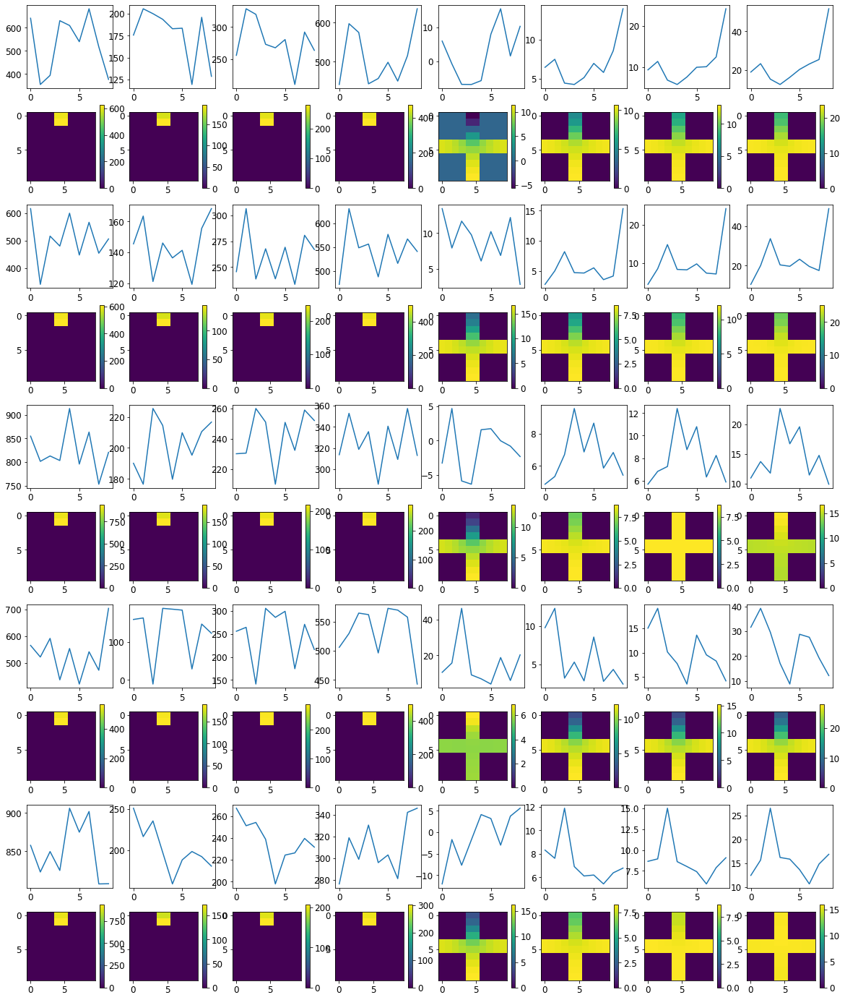

Loss: 


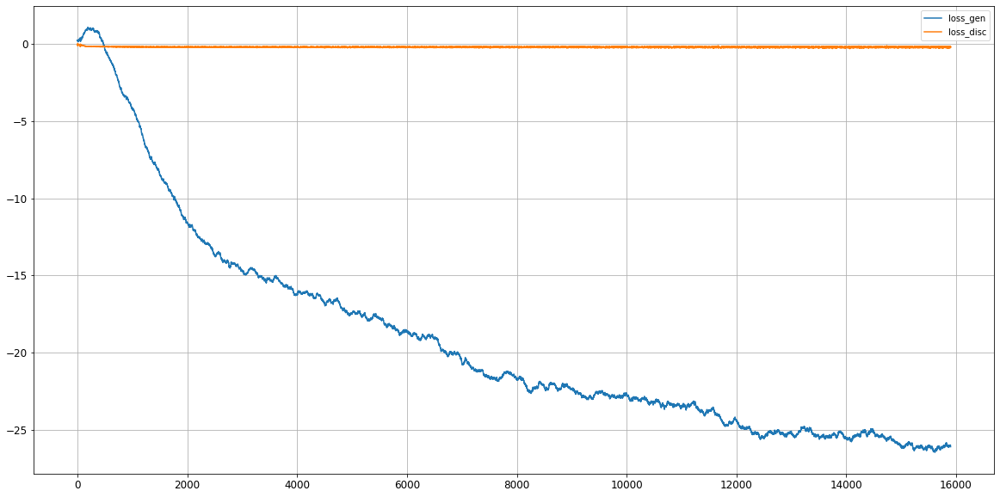

Epoch 16001/20000
critic: -0.172284 - generator: -26.013750 - 1s
disc_numpy -0.02963409
gen_numpy -26.160841
Epoch 16002/20000
critic: -0.187895 - generator: -25.998724 - 1s
disc_numpy -0.121845774
gen_numpy -26.131721
Epoch 16003/20000
critic: -0.221944 - generator: -25.984625 - 1s
disc_numpy -0.18283784
gen_numpy -26.04772
Epoch 16004/20000
critic: -0.216451 - generator: -25.983709 - 1s
disc_numpy -0.13124377
gen_numpy -26.011482
Epoch 16005/20000
critic: -0.175594 - generator: -25.972406 - 1s
disc_numpy -0.20271054
gen_numpy -25.797213
Epoch 16006/20000
critic: -0.240802 - generator: -25.953909 - 1s
disc_numpy -0.050266817
gen_numpy -25.939371
Epoch 16007/20000
critic: -0.195486 - generator: -25.917564 - 1s
disc_numpy -0.14542823
gen_numpy -25.963297
Epoch 16008/20000
critic: -0.201768 - generator: -25.974127 - 1s
disc_numpy -0.2636594
gen_numpy -26.134296
Epoch 16009/20000
critic: -0.168669 - generator: -25.937336 - 1s
disc_numpy -0.110868104
gen_numpy -25.856838
Epoch 16010/20000


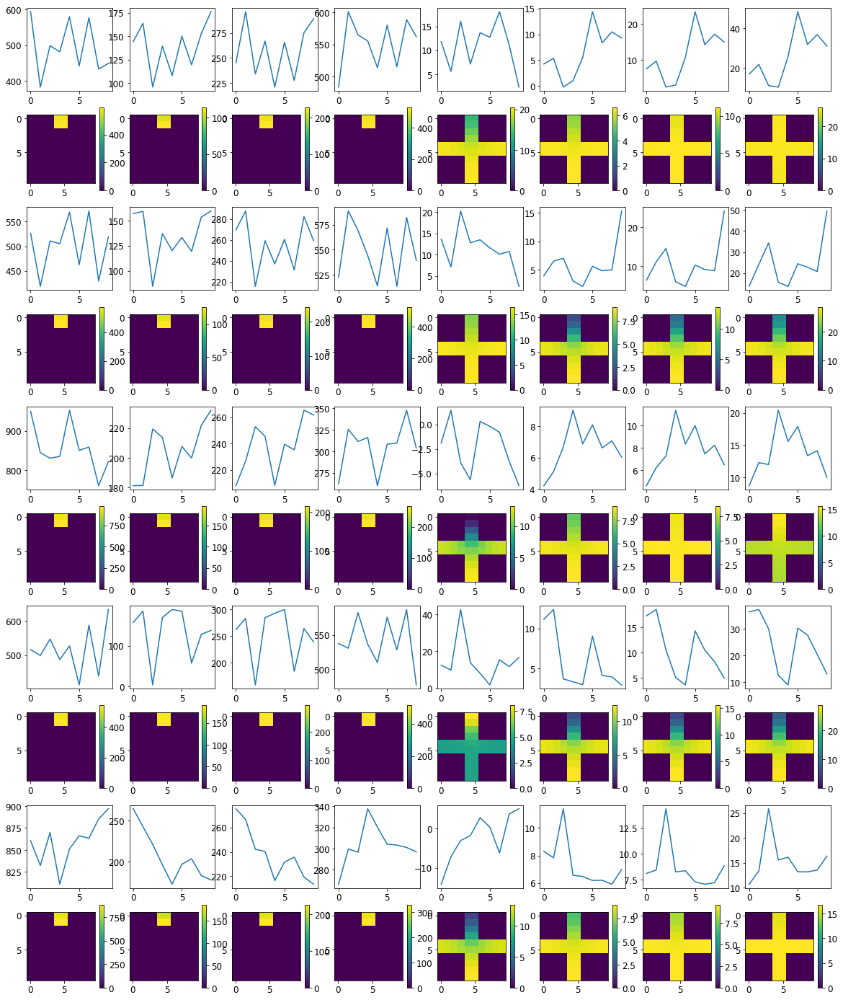

Loss: 


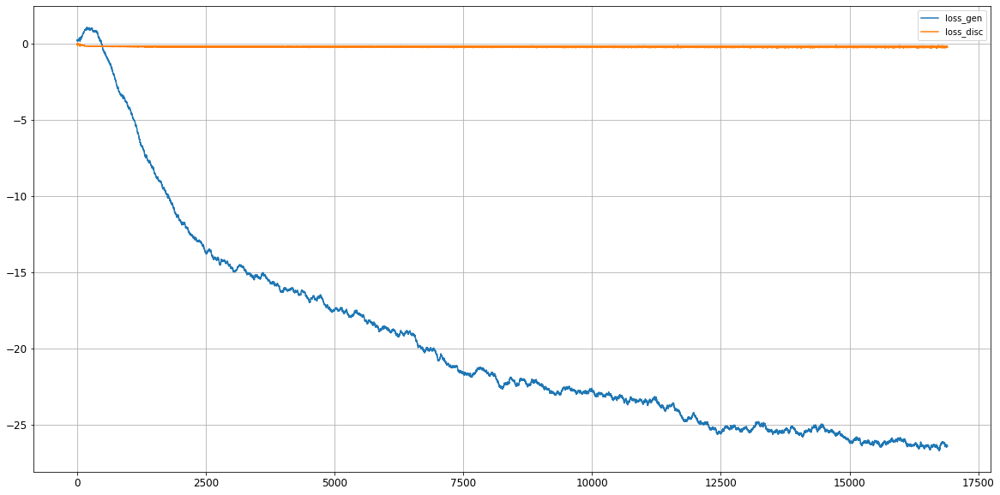

Epoch 17001/20000
critic: -0.194028 - generator: -26.411983 - 1s
disc_numpy -0.11376244
gen_numpy -26.403517
Epoch 17002/20000
critic: -0.175621 - generator: -26.437105 - 1s
disc_numpy -0.11886978
gen_numpy -26.502817
Epoch 17003/20000
critic: -0.177125 - generator: -26.473747 - 1s
disc_numpy 0.016110526
gen_numpy -26.59018
Epoch 17004/20000
critic: -0.191365 - generator: -26.445211 - 1s
disc_numpy -0.17308263
gen_numpy -26.63571
Epoch 17005/20000
critic: -0.226226 - generator: -26.418465 - 1s
disc_numpy -0.08630484
gen_numpy -26.396633
Epoch 17006/20000
critic: -0.138065 - generator: -26.378227 - 1s
disc_numpy 0.0071864016
gen_numpy -26.310026
Epoch 17007/20000
critic: -0.158026 - generator: -26.371523 - 1s
disc_numpy -0.2093285
gen_numpy -26.329975
Epoch 17008/20000
critic: -0.225977 - generator: -26.375662 - 1s
disc_numpy -0.25944984
gen_numpy -26.496073
Epoch 17009/20000
critic: -0.219216 - generator: -26.349792 - 1s
disc_numpy -0.24904434
gen_numpy -26.52054
Epoch 17010/20000
crit

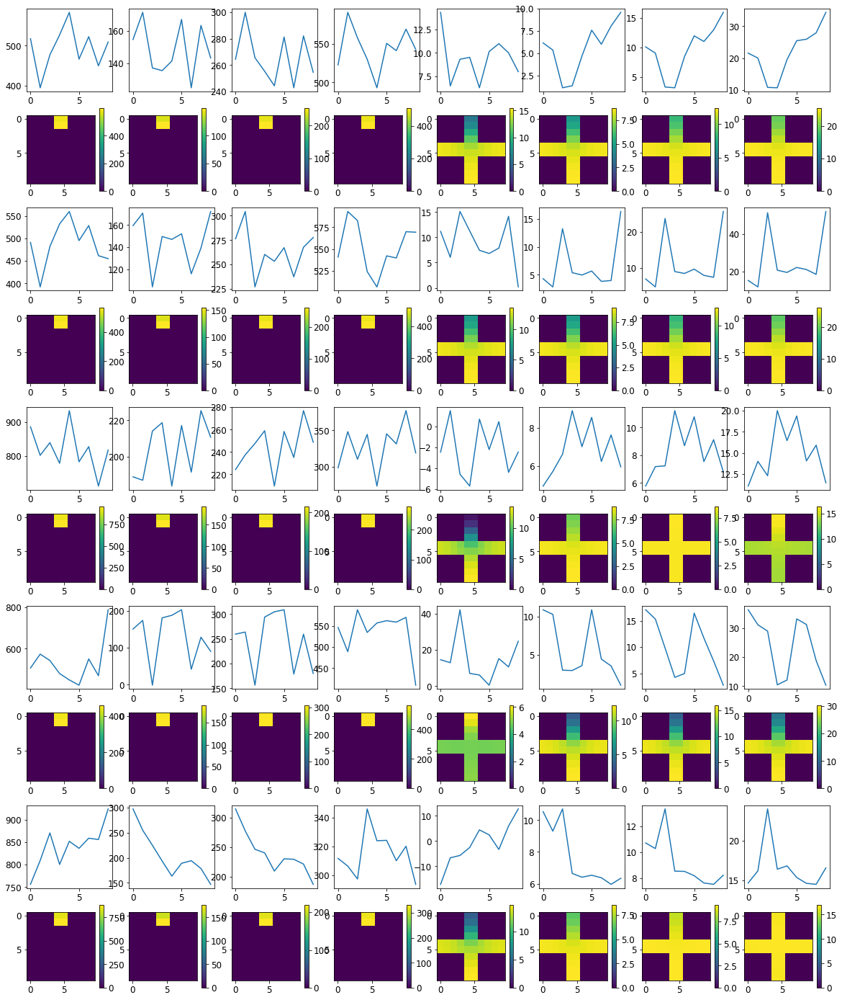

Loss: 


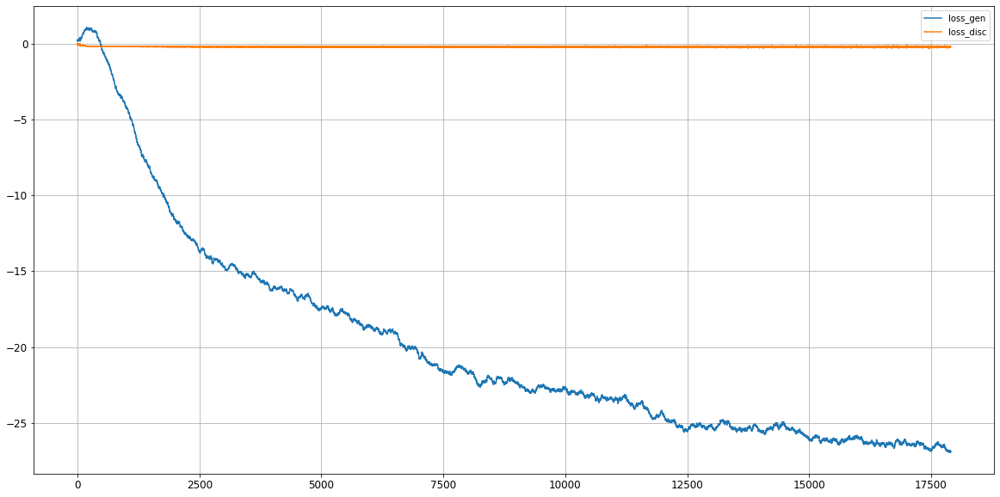

Epoch 18001/20000
critic: -0.239875 - generator: -26.933992 - 1s
disc_numpy -0.25821227
gen_numpy -27.024527
Epoch 18002/20000
critic: -0.148786 - generator: -26.956282 - 1s
disc_numpy 0.0014340878
gen_numpy -26.898096
Epoch 18003/20000
critic: -0.211516 - generator: -26.937260 - 1s
disc_numpy -0.23519206
gen_numpy -26.842522
Epoch 18004/20000
critic: -0.180805 - generator: -26.909058 - 1s
disc_numpy -0.12653111
gen_numpy -26.884565
Epoch 18005/20000
critic: -0.225948 - generator: -26.877768 - 1s
disc_numpy -0.25832093
gen_numpy -26.933407
Epoch 18006/20000
critic: -0.130238 - generator: -26.933691 - 1s
disc_numpy -0.072637945
gen_numpy -26.958136
Epoch 18007/20000
critic: -0.248384 - generator: -26.940763 - 1s
disc_numpy -0.2349424
gen_numpy -26.868544
Epoch 18008/20000
critic: -0.227553 - generator: -26.896250 - 1s
disc_numpy -0.252443
gen_numpy -26.931002
Epoch 18009/20000
critic: -0.170839 - generator: -26.943926 - 1s
disc_numpy -0.17330334
gen_numpy -27.092545
Epoch 18010/20000
cr

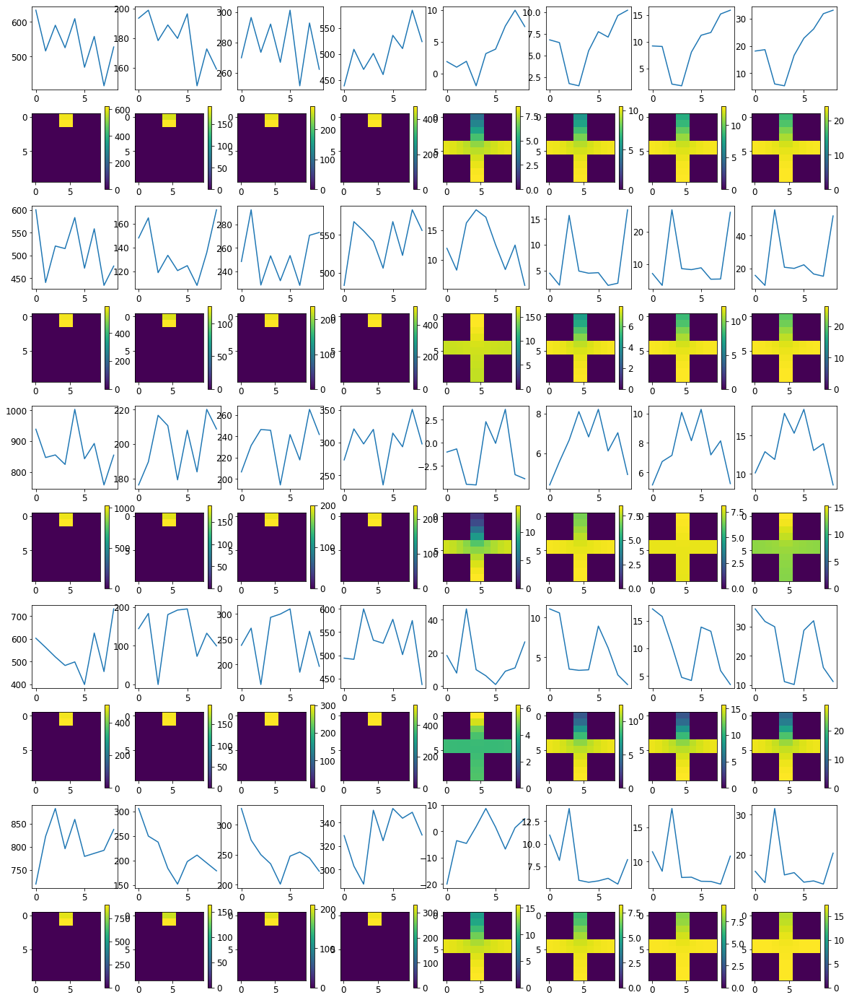

Loss: 


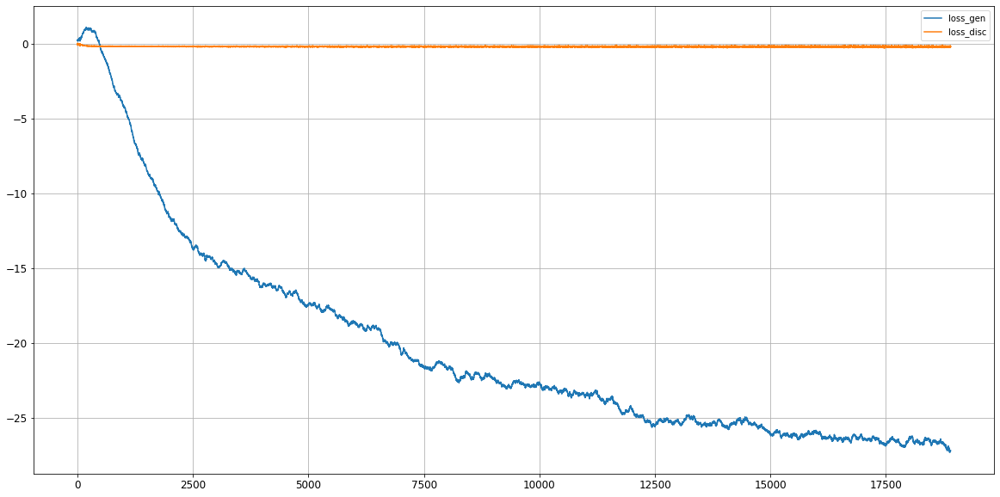

Epoch 19001/20000
critic: -0.191308 - generator: -27.141550 - 1s
disc_numpy -0.16779347
gen_numpy -27.21046
Epoch 19002/20000
critic: -0.244185 - generator: -27.231243 - 1s
disc_numpy -0.3218979
gen_numpy -27.33502
Epoch 19003/20000
critic: -0.171322 - generator: -27.242773 - 1s
disc_numpy 0.01123189
gen_numpy -27.255184
Epoch 19004/20000
critic: -0.182459 - generator: -27.200798 - 1s
disc_numpy -0.28743255
gen_numpy -27.172674
Epoch 19005/20000
critic: -0.218095 - generator: -27.207098 - 1s
disc_numpy -0.20863779
gen_numpy -27.216413
Epoch 19006/20000
critic: -0.216044 - generator: -27.261553 - 1s
disc_numpy -0.25213787
gen_numpy -27.405716
Epoch 19007/20000
critic: -0.211654 - generator: -27.286102 - 1s
disc_numpy -0.15616672
gen_numpy -27.42356
Epoch 19008/20000
critic: -0.186173 - generator: -27.227201 - 1s
disc_numpy -0.2708994
gen_numpy -27.241884
Epoch 19009/20000
critic: -0.236981 - generator: -27.226679 - 1s
disc_numpy -0.16660061
gen_numpy -27.308754
Epoch 19010/20000
critic:

In [36]:
hist = train(train_dataset, epochs=20000)

In [37]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


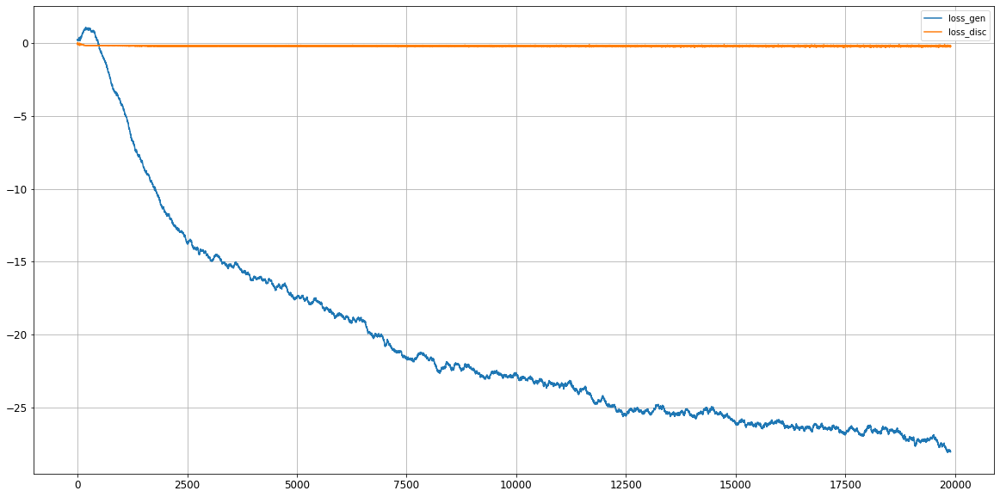

In [38]:
fig, ax = plt.subplots(1,1, figsize=[20,10])
ax.plot(hist[100:])
ax.legend(['loss_gen', 'loss_disc'])
#ax.set_yscale('log')
ax.grid()

In [40]:
#from tensorflow.keras.models import load_model
import joblib
joblib.dump(scaler, "scaler-tfex.pkl")
wgan.save("wgan-tfex.h5")

In [66]:
np.random.seed(10)
tf.random.set_seed(10)

noise = tf.random.normal(shape=[1, latent_space])
X_generated = scaler.inverse_transform((wgan.layers[0].predict(noise).reshape(ntimes,15)+1)/2)
X_generated = pca_compress.inverse_transform(X_generated)
X_generated[X_generated<0.0] = 0.0

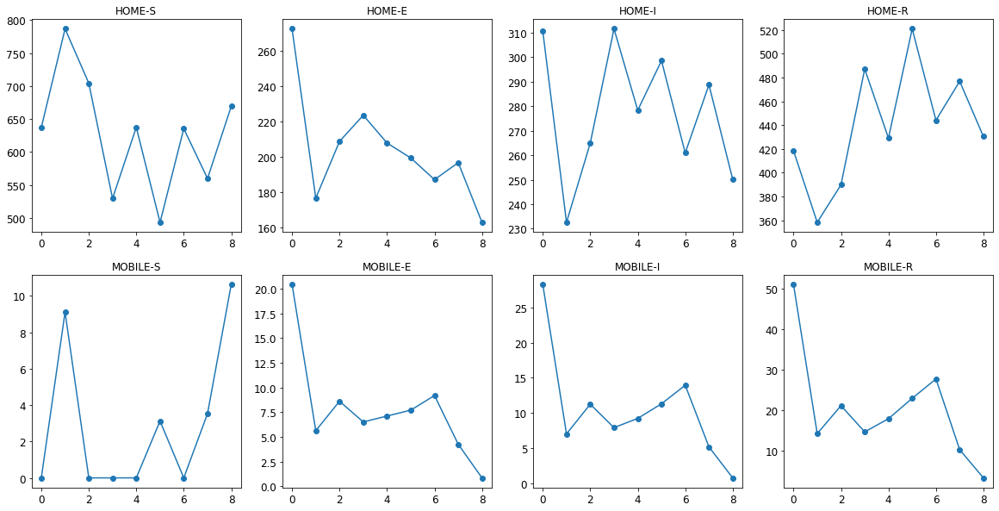

In [67]:
fig, ax = plt.subplots(2,4, figsize=[20,10])
for i, group in enumerate(groups):
    ax.flatten()[i].plot(X_generated[:,i*nl*nc+4], '-o')
    ax.flatten()[i].set_title(group)

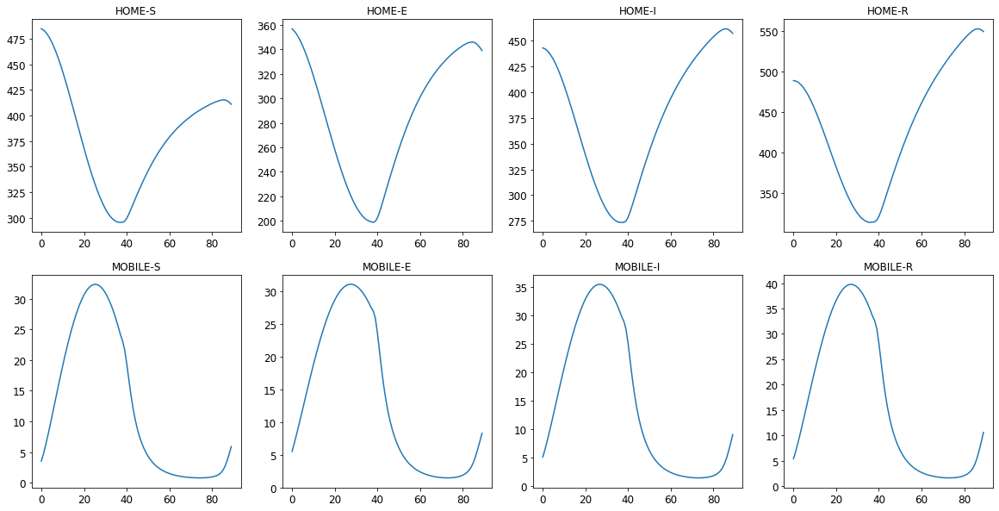

In [68]:
fig, ax = plt.subplots(2,4, figsize=[20,10])
for i, group in enumerate(groups):
    ax.flatten()[i].plot(X_train_1D[2930:3020,i*nl*nc+4])
    ax.flatten()[i].set_title(group)

9
3888


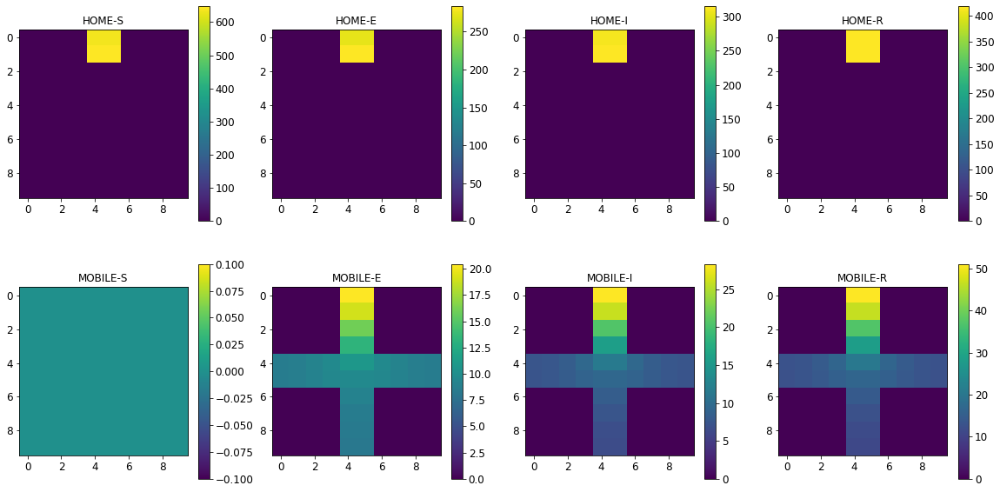

In [70]:
print(ntimes)
print(len(times))
fig, ax = plt.subplots(2,4, figsize=[20,10])
for i, group in enumerate(groups):
    im = ax.flatten()[i].imshow(X_generated.reshape(ntimes,len(groups),nl,nc)[0,i,:,:])
    fig.colorbar(im, ax=ax.flatten()[i])
    ax.flatten()[i].set_title(group)

3888


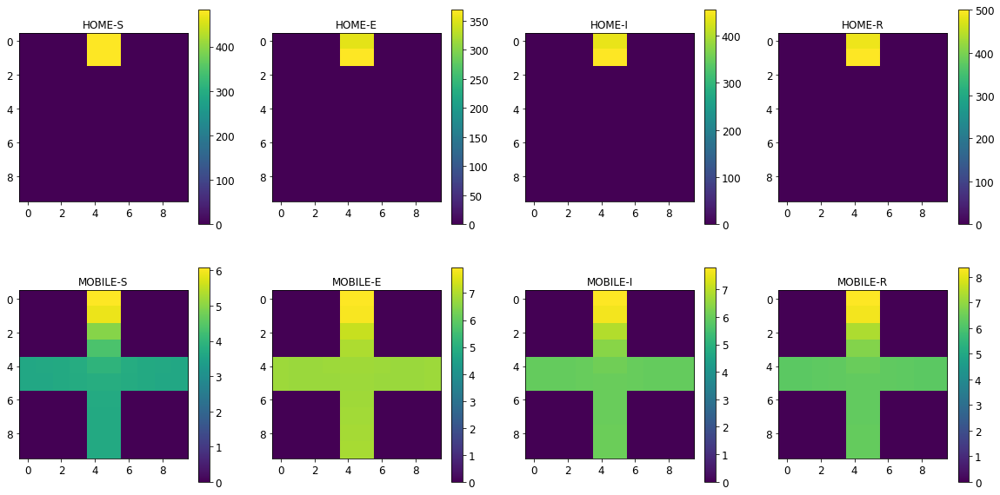

In [71]:
print(len(times))
fig, ax = plt.subplots(2,4, figsize=[20,10])
for i, group in enumerate(groups):
    im = ax.flatten()[i].imshow(X_train_1D.reshape(len(times),len(groups),nl,nc)[2932,i,:,:])
    fig.colorbar(im, ax=ax.flatten()[i])
    ax.flatten()[i].set_title(group)

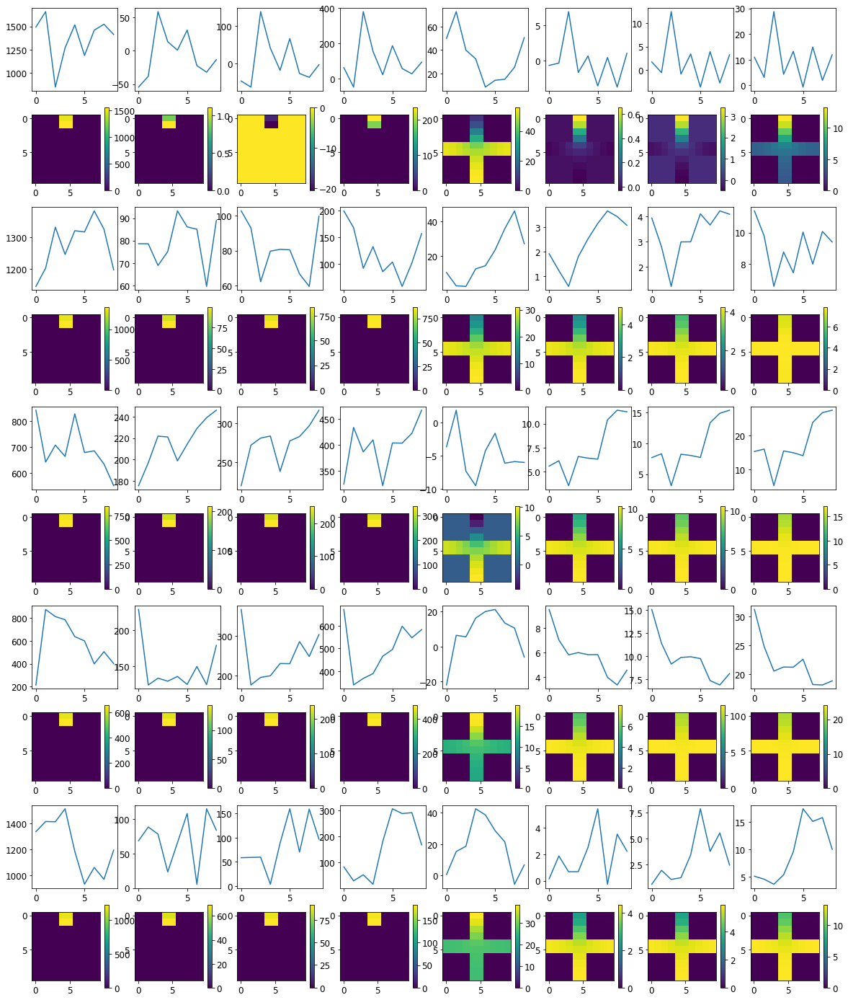

In [48]:
npredict = 5
noise = tf.random.normal(shape=[npredict, latent_space])
X_generated = scaler.inverse_transform((wgan.layers[0].predict(noise).reshape(npredict*ntimes,15)+1)/2)
X_generated = pca_compress.inverse_transform(X_generated)
X_generated = X_generated.reshape(npredict, ntimes, len(groups)*nl*nc)
fig, ax = plt.subplots(npredict*2,len(groups), figsize=[20,npredict*5])
for j in range(npredict):
    for i, group in enumerate(groups):
        for k in range(0,10,10): 
            ax.flatten()[i+2*j*len(groups)].plot(X_generated[j][:,i*nl*nc+4+10*k], '-')
    for i, group in enumerate(groups):
        im = ax.flatten()[i+(2*j+1)*len(groups)].imshow(X_generated[j].reshape(ntimes,len(groups),nl,nc)[4,i,:,:])
        fig.colorbar(im, ax=ax.flatten()[i+(2*j+1)*len(groups)])
